In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import linearmodels
from linearmodels import PanelOLS
from linearmodels import RandomEffects
import seaborn as sns
import sys
import locale

print(sys.getfilesystemencoding())
print(locale.getpreferredencoding())

utf-8
cp1251


In [2]:
global_df = pd.read_excel("C:/Users/pkath/OneDrive/Рабочий стол/Диплом 2023/Data/Общий.xlsx", index_col=0)

In [171]:
global_df.to_excel("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/grant_party.xlsx")

In [172]:
global_df = pd.read_stata("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/grant_votes_0.dta")
global_df

,id,year,period,region,G1,G2,G3,doxod,President_num,year_vo,President_voters,notrural_shr,poverty_shr,pop,isRep
0,1,2005,1,Республика Башкортостан,0.000000,0.000000,1.130913,70.615268,2365768,2004,2.577651e+06,59.8,14.9,4073803.0,1.0
1,1,2006,1,Республика Башкортостан,0.000000,0.000000,0.180407,69.858207,2365768,2004,2.577651e+06,59.8,14.5,4059848.0,1.0
2,1,2007,1,Республика Башкортостан,0.000000,1.295088,0.045614,92.579552,2365768,2004,2.577651e+06,60.0,12.8,4054129.0,1.0
3,1,2008,1,Республика Башкортостан,2.553098,2.370853,0.000000,116.538216,2365768,2004,2.577651e+06,60.1,11.5,4057096.0,1.0
4,1,2009,2,Республика Башкортостан,2.780650,2.133768,0.429660,114.095746,2315467,2008,2.630914e+06,60.3,11.2,4063959.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1355,96,2016,3,Город Байконур (Республика Казахстан),0.846048,0.000000,0.019414,3.122617,7509,2012,1.060743e+04,NaN,NaN,NaN,0.0
1356,96,2017,3,Город Байконур (Республика Казахстан),1.247032,0.000000,0.000000,3.456213,7509,2012,1.060743e+04,NaN,NaN,NaN,0.0
1357,96,2018,3,Город Байконур (Республика Казахстан),1.484090,0.000000,0.000000,3.667584,7509,2012,1.060743e+04,NaN,NaN,NaN,0.0
1358,96,2019,4,Город Байконур (Республика Казахстан),2.345711,0.000000,0.000000,4.388421,7568,2018,9.659221e+03,NaN,NaN,NaN,0.0


In [173]:
## Party region merging

#global_df[global_df['region'] == 'Иркутская область']
#global_df[global_df['id'] == 38]

id_91 = global_df[(global_df['id'] == 70) | (global_df['id'] == 81)]
id_91 = id_91.groupby(['year', 'period', 'year_vo'], dropna = False).sum().reset_index()
id_91['id'] = 91
id_91['notrural_shr'] = 'NaN'
id_91['poverty_shr'] = 'NaN'
id_91['pop'] = 'NaN'
id_91['region'] = 'Забайкальский край'
global_df = global_df[(global_df['id'] != 70) & (global_df['id'] != 81)]

id_56 = global_df[(global_df['id'] == 56) | (global_df['id'] == 82)][global_df['year'] <= 2006]
global_df = global_df[(global_df['id'] != 82)]
global_df = global_df[(global_df['year'] > 2006)].append(global_df[(global_df['year'] <= 2006) & (global_df['id'] != 56)])
id_56 = id_56.groupby(['year', 'period', 'year_vo'], dropna = False).sum().reset_index()
id_56['id'] = 56
id_56['notrural_shr'] = 'NaN'
id_56['poverty_shr'] = 'NaN'
id_56['pop'] = 'NaN'
id_56['region'] = 'Пермский край'


id_38 = global_df[(global_df['id'] == 38) | (global_df['id'] == 83)][global_df['year'] <= 2007]
global_df = global_df[(global_df['id'] != 83)]
global_df = global_df[(global_df['year'] > 2007)].append(global_df[(global_df['year'] <= 2007) & (global_df['id'] != 38)])
id_38 = id_38.groupby(['year', 'period', 'year_vo'], dropna = False).sum().reset_index()
id_38['id'] = 38
id_38['notrural_shr'] = 'NaN'
id_38['poverty_shr'] = 'NaN'
id_38['pop'] = 'NaN'
id_38['region'] = 'Камчатский край'


id_19 = global_df[(global_df['id'] == 19) | (global_df['id'] == 85) | (global_df['id'] == 89)][global_df['year'] <= 2006]
global_df = global_df[(global_df['id'] != 85) & (global_df['id'] != 89)]
global_df = global_df[(global_df['year'] > 2006)].append(global_df[(global_df['year'] <= 2006) & (global_df['id'] != 19)])
id_19 = id_19.groupby(['year', 'period', 'year_vo'], dropna = False).sum().reset_index()
id_19['id'] = 19
#id_19['notrural_shr'] = 'NaN'
#id_19['poverty_shr'] = 'NaN'
#id_19['pop'] = 'NaN'
id_19['region'] = 'Красноярский край'


id_34 = global_df[(global_df['id'] == 34) | (global_df['id'] == 86)][global_df['year'] <= 2007]
global_df = global_df[(global_df['id'] != 86)]
global_df = global_df[(global_df['year'] > 2007)].append(global_df[(global_df['year'] <= 2007) & (global_df['id'] != 34)])
id_34 = id_34.groupby(['year', 'period', 'year_vo'], dropna = False).sum().reset_index()
id_34['id'] = 34
#id_19['notrural_shr'] = 'NaN'
#id_19['poverty_shr'] = 'NaN'
#id_19['pop'] = 'NaN'
id_34['region'] = 'Иркутская область'

global_df = pd.concat([global_df, id_91, id_56, id_38, id_19, id_34])
global_df.sort_values(['id', 'year'])

C:\Users\HP\AppData\Local\Temp\ipykernel_13464\754563793.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  id_91 = id_91.groupby(['year', 'period', 'year_vo'], dropna = False).sum().reset_index()
C:\Users\HP\AppData\Local\Temp\ipykernel_13464\754563793.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  id_56 = global_df[(global_df['id'] == 56) | (global_df['id'] == 82)][global_df['year'] <= 2006]
C:\Users\HP\AppData\Local\Temp\ipykernel_13464\754563793.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  global_df = global_df[(global_df['year'] > 2006)].append(global_df[(global_df['year'] <= 2006) & (global_df['id'] != 56)])
C:\Users\HP\AppData\Local\Temp\ipykernel_13464\754

,id,year,period,region,G1,G2,G3,doxod,President_num,year_vo,President_voters,notrural_shr,poverty_shr,pop,isRep
0,1,2005,1,Республика Башкортостан,0.000000,0.000000,1.130913,70.615268,2365768,2004,2.577651e+06,59.8,14.9,4073803.0,1.0
1,1,2006,1,Республика Башкортостан,0.000000,0.000000,0.180407,69.858207,2365768,2004,2.577651e+06,59.8,14.5,4059848.0,1.0
2,1,2007,1,Республика Башкортостан,0.000000,1.295088,0.045614,92.579552,2365768,2004,2.577651e+06,60.0,12.8,4054129.0,1.0
3,1,2008,1,Республика Башкортостан,2.553098,2.370853,0.000000,116.538216,2365768,2004,2.577651e+06,60.1,11.5,4057096.0,1.0
4,1,2009,2,Республика Башкортостан,2.780650,2.133768,0.429660,114.095746,2315467,2008,2.630914e+06,60.3,11.2,4063959.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1355,96,2016,3,Город Байконур (Республика Казахстан),0.846048,0.000000,0.019414,3.122617,7509,2012,1.060743e+04,NaN,NaN,NaN,0.0
1356,96,2017,3,Город Байконур (Республика Казахстан),1.247032,0.000000,0.000000,3.456213,7509,2012,1.060743e+04,NaN,NaN,NaN,0.0
1357,96,2018,3,Город Байконур (Республика Казахстан),1.484090,0.000000,0.000000,3.667584,7509,2012,1.060743e+04,NaN,NaN,NaN,0.0
1358,96,2019,4,Город Байконур (Республика Казахстан),2.345711,0.000000,0.000000,4.388421,7568,2018,9.659221e+03,NaN,NaN,NaN,0.0


In [174]:
global_df.to_excel("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/grant_votes_0.xlsx")

In [16]:
#votes = pd.read_stata("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/grant_votes_1.dta")
#party = pd.read_stata("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/grant_party_1.dta")

votes = pd.read_excel("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Data/Общий_Президент.xlsx")
party = pd.read_excel("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Data/Общий_Партия.xlsx")

party = votes.set_index(['id', 'year']).join(party.set_index(['id', 'year']), lsuffix='_pres', rsuffix='_party', how = 'outer').reset_index()
party

,id,year,period_pres,region_vo_pres,President_num,President_shr,year_vo_pres,President_voters,region_pres,G1_pres,...,isRep_party,G_sum_party,logG1_party,logG2_party,logG_sum_party,rural_party,ifPartyEl_party,logpop_party,logincome_party,ifPresEl_party
0,1,2003.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2004.0,1.0,Республика Башкортостан,2365768.0,91.78,2004.0,2.577651e+06,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,2005.0,1.0,Республика Башкортостан,2365768.0,91.78,2004.0,2.577651e+06,Республика Башкортостан,0.0,...,1.0,1.130913,0.0,0.756551,0.756551,40.200001,0.0,15.220087,4.257246,0.0
3,1,2005.0,NaN,NaN,NaN,NaN,NaN,NaN,Республика Башкортостан,0.0,...,1.0,1.130913,0.0,0.756551,0.756551,40.200001,0.0,15.220087,4.257246,0.0
4,1,2006.0,1.0,Республика Башкортостан,2365768.0,91.78,2004.0,2.577651e+06,Республика Башкортостан,0.0,...,1.0,0.180407,0.0,0.165859,0.165859,40.200001,0.0,15.216656,4.246468,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2848,96,2015.0,NaN,NaN,NaN,NaN,NaN,NaN,Город Байконур (Республика Казахстан),0.0,...,0.0,0.040908,0.0,0.040093,0.040093,NaN,0.0,NaN,1.212167,0.0
2849,1000,NaN,1.0,Территория за пределами Российская Федерация,232505.0,85.13,2004.0,2.731176e+05,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2850,1000,NaN,2.0,Территория за пределами Российская Федерация,283298.0,85.80,2008.0,3.301841e+05,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2851,1000,NaN,3.0,Территория за пределами Российская Федерация,323686.0,73.24,2012.0,4.419525e+05,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
party.to_excel("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/merged.xlsx", index = False)

## Describe

In [2]:
grant_party = pd.read_stata("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/Code/merged.dta")
grant_party.dtypes

id                     int8
year                  int16
period_pres         float64
period_party        float64
region               object
Party_num           float64
Party_shr           float64
Party_voters        float64
year_party          float64
President_num       float64
President_shr       float64
year_pres           float64
President_voters    float64
G1                  float64
G2                  float64
income              float64
notrural_shr        float64
poverty_shr         float64
pop                 float64
isRep               float64
G_sum               float64
logG1               float64
logG2               float64
logG_sum            float64
rural               float64
logpop              float64
logincome           float64
ifPartyEl           float32
ifPresEl            float32
_est_est1              int8
_est_est2              int8
_est_est3              int8
_est_est4              int8
dtype: object

In [3]:
df = grant_party.copy()
df["G1_pc"] = df["G1"]*1000000000/df["pop"]
df["G2_pc"] = df["G2"]*1000000000/df["pop"]
df["G_sum_pc"] = df["G_sum"]/df["pop"]
df["income_pc"] = df["income"]/df["pop"]

df['G1_shr'] = df["G1"]/df["income"]*100
df['G2_shr'] = df["G2"]/df["income"]*100
df['G_sum_shr'] = df["G_sum"]/df["income"]*100



In [4]:
print(df[['G1_pc', 'G2_pc', 'G1_shr', 'G2_shr']].describe().to_latex(index=True,
                  formatters={"name": str.upper},
                  float_format="{:.2f}".format,
                  label = 'Grant_summary'
))
#'G1', 'G2', 

\begin{table}
\centering
\label{Grant_summary}
\begin{tabular}{lrrrr}
\toprule
{} &     G1\_pc &     G2\_pc &  G1\_shr &  G2\_shr \\
\midrule
count &   1317.00 &   1317.00 & 1337.00 & 1337.00 \\
mean  &   7443.72 &   1747.59 &   11.40 &    2.37 \\
std   &  19387.51 &   7725.62 &   13.04 &    4.13 \\
min   &      0.00 &      0.00 &    0.00 &    0.00 \\
25\%   &    695.50 &    181.04 &    1.57 &    0.47 \\
50\%   &   2546.88 &    593.30 &    6.23 &    1.45 \\
75\%   &   6656.87 &   1239.10 &   17.33 &    2.75 \\
max   & 247739.38 & 137599.25 &   67.79 &   50.31 \\
\bottomrule
\end{tabular}
\end{table}



C:\Users\HP\AppData\Local\Temp\ipykernel_17624\414102348.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df[['G1_pc', 'G2_pc', 'G1_shr', 'G2_shr']].describe().to_latex(index=True,


In [5]:
print(df[["Party_shr", "President_shr",  "income", 'rural', 'poverty_shr']].describe().to_latex(index=True,
                  formatters={"name": str.upper},
                  float_format="{:.2f}".format,
                  label = 'Vars_summary'
)) 

\begin{table}
\centering
\label{Vars_summary}
\begin{tabular}{lrrrrr}
\toprule
{} &  Party\_shr &  President\_shr &  income &   rural &  poverty\_shr \\
\midrule
count &    1337.00 &        1337.00 & 1337.00 & 1317.00 &      1310.00 \\
mean  &       0.52 &           0.69 &   99.44 &   30.25 &        15.55 \\
std   &       0.16 &           0.10 &  197.56 &   13.17 &         6.07 \\
min   &       0.26 &           0.47 &    2.82 &    0.00 &         4.80 \\
25\%   &       0.38 &           0.62 &   28.60 &   22.20 &        11.80 \\
50\%   &       0.49 &           0.67 &   54.34 &   29.41 &        14.50 \\
75\%   &       0.62 &           0.74 &  103.54 &   36.40 &        18.18 \\
max   &       0.99 &           1.00 & 2880.72 &   73.80 &        61.10 \\
\bottomrule
\end{tabular}
\end{table}



C:\Users\HP\AppData\Local\Temp\ipykernel_17500\4139195873.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df[["Party_shr", "President_shr",  "income", 'rural', 'poverty_shr']].describe().to_latex(index=True,


In [27]:
df[['G1', 'G2', 'G_sum', "Party_shr", "President_shr",  "income", 'rural', 'poverty_shr']].describe().to_excel("C:/Users/HP/Desktop/Диплом Катя/Диплом 2023/GraphsTables/summary.xlsx", index = True)

In [5]:
russia  = df.groupby(['year']).sum().reset_index()
russia

C:\Users\HP\AppData\Local\Temp\ipykernel_17652\4049709280.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  russia  = df.groupby(['year']).sum().reset_index()


,year,id,period_pres,period_party,Party_num,Party_shr,Party_voters,year_party,President_num,President_shr,...,_est_est2,_est_est3,_est_est4,G1_pc,G2_pc,G_sum_pc,income_pc,G1_shr,G2_shr,G_sum_shr
0,2003,3555,0.0,75.0,21635990.0,2837.090000,5.839301e+07,150225.0,0.0,0.00,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2004,3555,79.0,74.0,21603241.0,2794.880000,5.831542e+07,148222.0,48058048.0,5617.04,...,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2005,3555,79.0,74.0,21603241.0,2794.880000,5.831542e+07,148222.0,48058048.0,5617.04,...,0,0,0,160965.720174,33791.509799,0.000195,0.001662,775.328516,173.824354,949.152871
3,2006,3555,79.0,74.0,21603241.0,2794.880000,5.831542e+07,148222.0,48058048.0,5617.04,...,0,0,0,195427.662250,30369.281437,0.000226,0.001338,1230.891918,191.847394,1422.739313
4,2007,3555,79.0,148.0,42320771.0,4742.875990,6.640668e+07,148518.0,48058048.0,5617.04,...,72,0,0,222876.915327,28444.826295,0.000251,0.002095,884.331844,114.680771,999.012623
5,2008,3555,158.0,148.0,42320771.0,4742.875990,6.640668e+07,148518.0,51092245.0,5479.54,...,0,74,74,293569.771089,31313.924086,0.000325,0.002711,867.442237,96.789944,964.232176
6,2009,3560,158.0,148.0,42320771.0,4742.875990,6.640668e+07,148518.0,51092245.0,5479.54,...,0,0,0,392115.234561,113751.534800,0.000506,0.002938,910.944601,281.703287,1192.647891
7,2010,3560,158.0,148.0,42320771.0,4742.875990,6.640668e+07,148518.0,51092245.0,5479.54,...,0,0,0,438972.423497,65090.720262,0.000504,0.003208,889.488705,131.844651,1021.333349
8,2011,3560,156.0,222.0,30511182.0,3540.155861,6.277437e+07,148814.0,50563746.0,5412.86,...,74,0,0,458491.149191,73181.109772,0.000532,0.003656,816.661948,136.609643,953.271589
9,2012,3651,234.0,222.0,30511182.0,3540.155861,6.277437e+07,148814.0,43557450.0,4958.05,...,0,74,74,468460.483649,48584.167596,0.000517,0.003927,769.359906,85.203403,854.563304


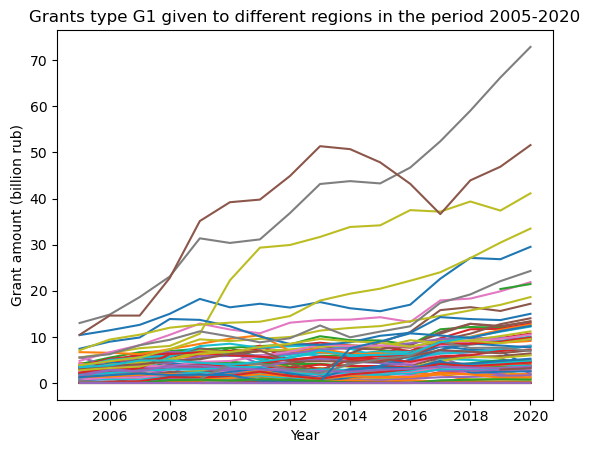

In [5]:
for region in df['region'].unique()[::]:    
    plt.plot(df[df['region']==region]["year"], df[df['region']==region]["G1"])
    plt.ylabel('Grant amount (billion rub)')
    plt.xlabel('Year')
    plt.title("Grants type G1 given to different regions in the period 2005-2020");

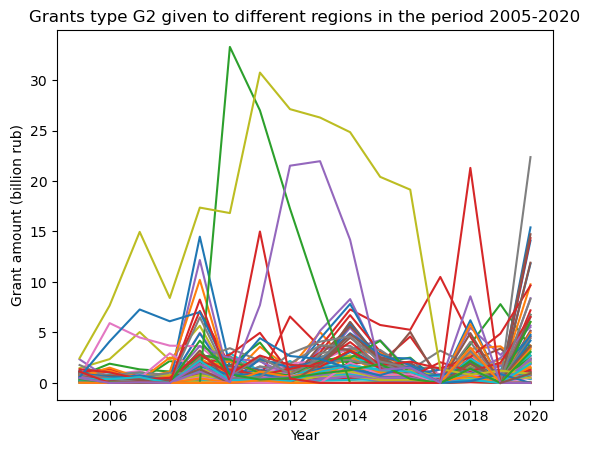

In [16]:
for region in df['region'].unique()[::]:    
    plt.plot(df[df['region']==region]["year"], df[df['region']==region]["G2"], label = region)
    #plt.legend([region])
    plt.ylabel('Grant amount (billion rub)')
    plt.xlabel('Year')
    plt.title("Grants type G2 given to different regions in the period 2005-2020");

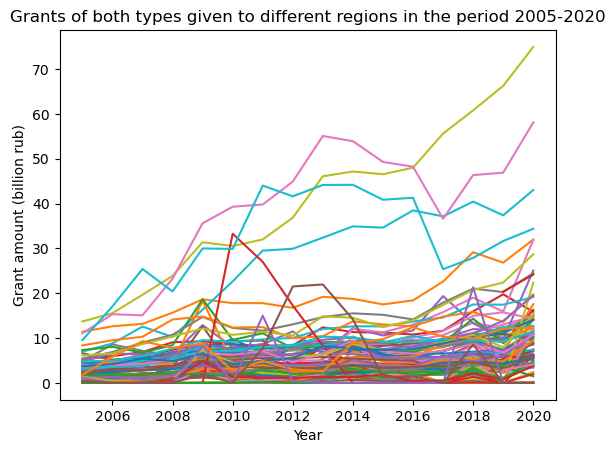

In [51]:
for region in df['region'].unique()[::]:    
    plt.plot(df[df['region']==region]["year"], df[df['region']==region]["G_sum"])
    plt.ylabel('Grant amount (billion rub)')
    plt.xlabel('Year')
    plt.title("Grants of both types given to different regions in the period 2005-2020");

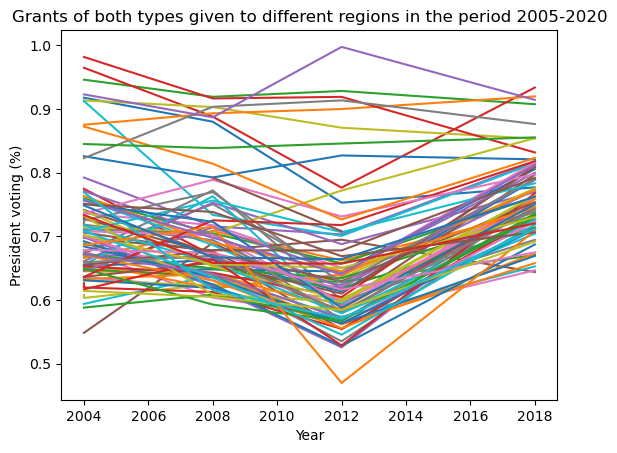

In [71]:
for region in df['region'].unique()[::]:    
    plt.plot(df[df['region']==region]["year_vo_pres"], df[df['region']==region]["President_shr"])
    plt.ylabel('President voting (%)')
    plt.xlabel('Year')
    plt.title("Voting for president regions in the period 2005-2020");

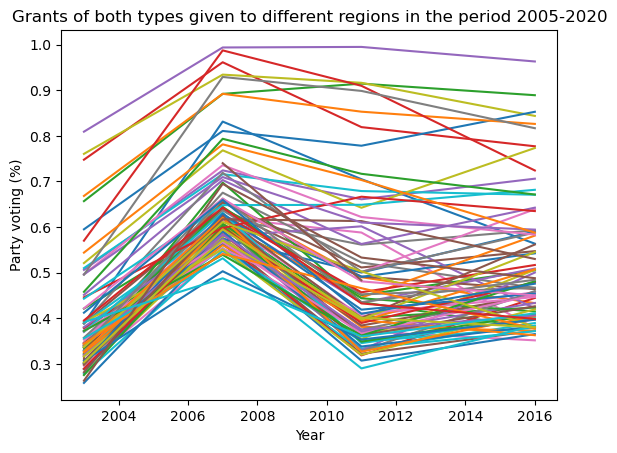

In [72]:
for region in df['region'].unique()[::]:    
    plt.plot(df[df['region']==region]["year_vo_party"], df[df['region']==region]["Party_shr"])
    plt.ylabel('Party voting (%)')
    plt.xlabel('Year')
    plt.title("Grants of both types given to different regions in the period 2005-2020");

In [19]:
country_lvl_pres = df.groupby(['year_pres']).sum().reset_index()
country_lvl_pres['President_shr'] = country_lvl_pres['President_num']*100/country_lvl_pres['President_voters']

country_lvl_party = df.groupby(['year_party']).sum().reset_index()
country_lvl_party['Party_shr'] = country_lvl_party['Party_num']*100/country_lvl_party['Party_voters']

country_lvl_pres[['year_pres','President_shr']]

C:\Users\HP\AppData\Local\Temp\ipykernel_17652\963480065.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  country_lvl_pres = df.groupby(['year_pres']).sum().reset_index()
C:\Users\HP\AppData\Local\Temp\ipykernel_17652\963480065.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  country_lvl_party = df.groupby(['year_party']).sum().reset_index()


,year_pres,President_shr
0,2004.0,70.982136
1,2008.0,70.050546
2,2012.0,63.066729
3,2018.0,76.397550


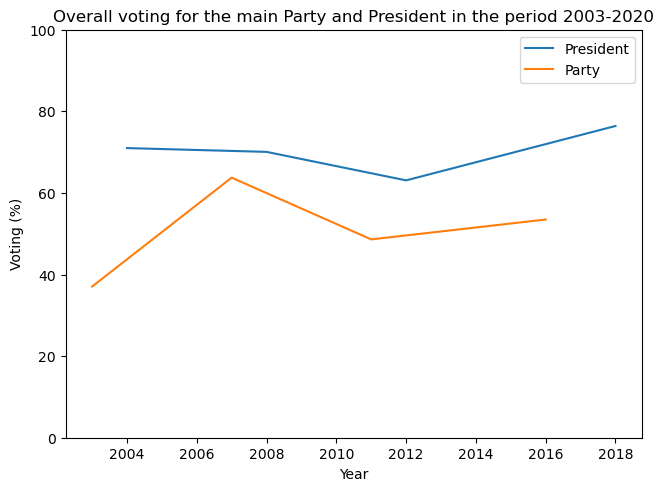

In [33]:
plt.figure(layout='constrained')
plt.plot(country_lvl_pres['year_pres'], country_lvl_pres['President_shr'], label='President')  # Plot some data on the axes.
plt.plot(country_lvl_party['year_party'], country_lvl_party['Party_shr'], label='Party')
plt.ylim(0, 100) # Plot more data on the axes...
plt.xlabel('Year')  # Add an x-label to the axes.
plt.ylabel('Voting (%)')  # Add a y-label to the axes.
plt.title("Overall voting for the main Party and President in the period 2003-2020")  # Add a title to the axes.
plt.legend()

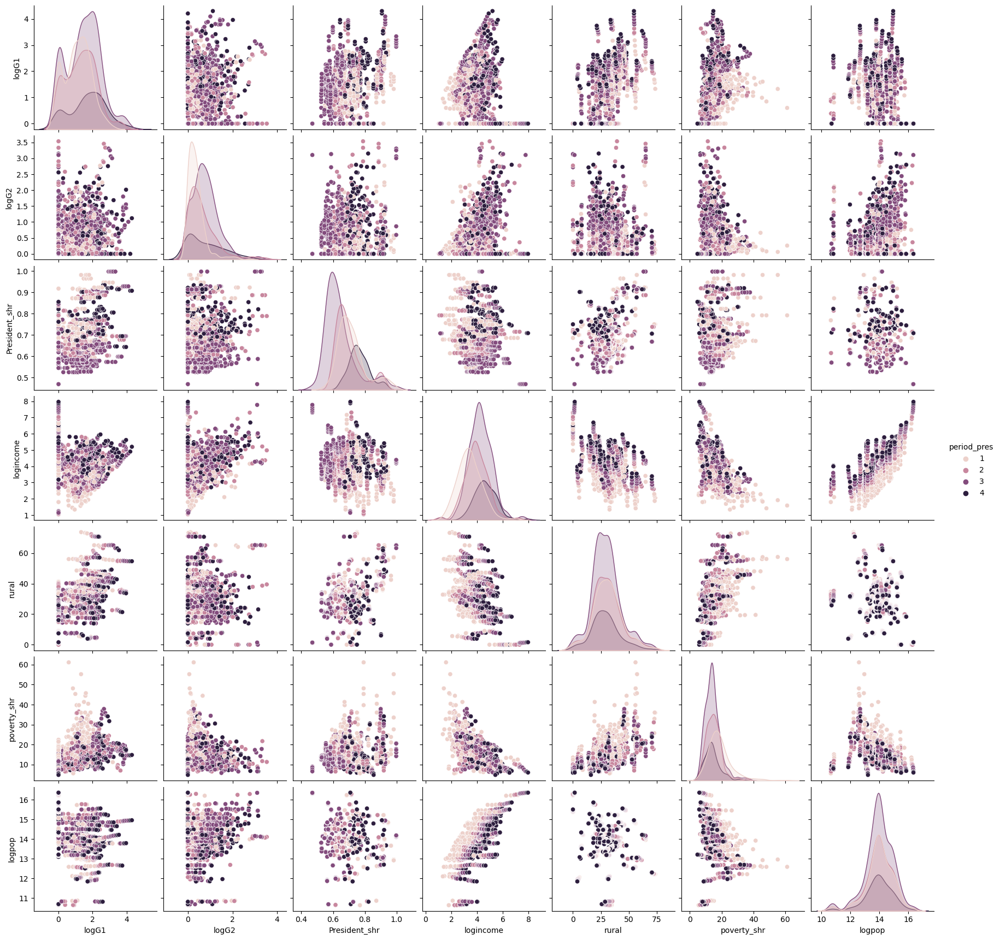

In [8]:
#df[[ "Party_shr", "President_shr", "income", 'rural', 'poverty_shr']].hist() #add other controls income
var =  df[['logG1', 'logG2', 'President_shr', 'period_pres', "logincome", 'logpop', 'rural', 'poverty_shr']]
sns.pairplot(var, hue = 'period_pres')

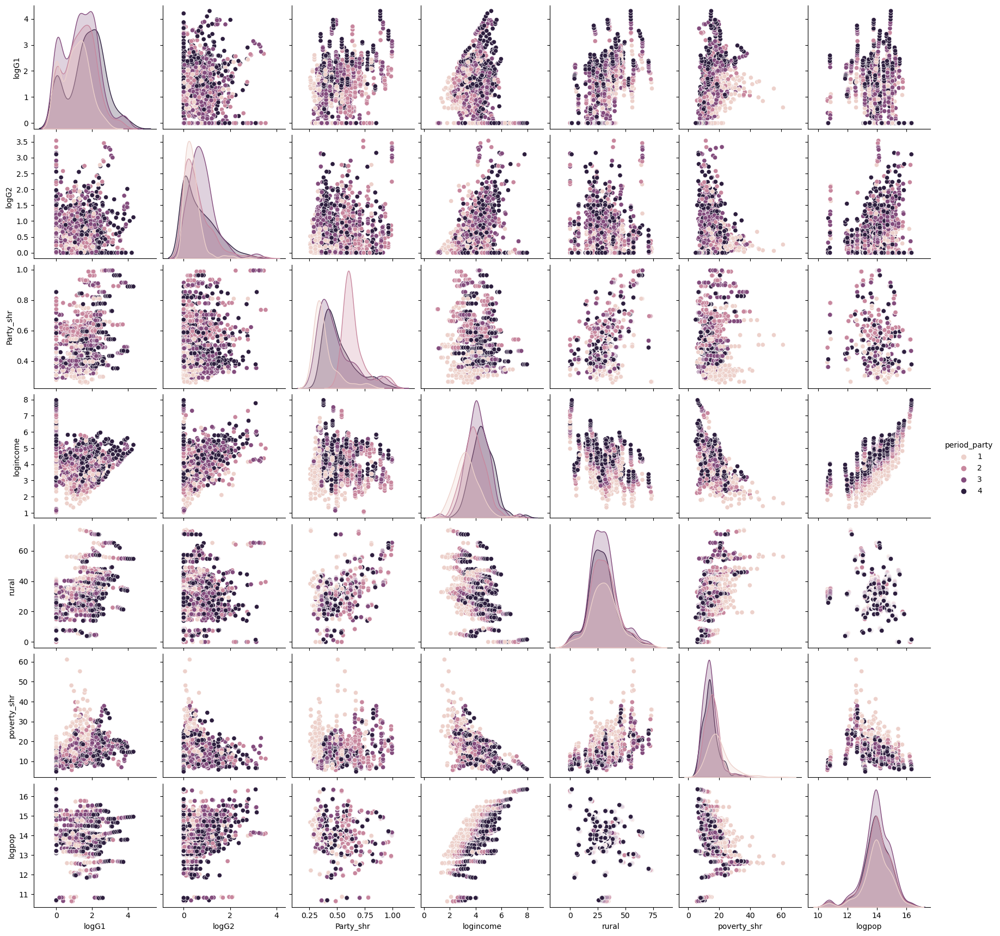

In [9]:
var =  df[['logG1', 'logG2', 'Party_shr', "logincome", 'rural', 'poverty_shr', 'period_party', 'logpop']]
sns.pairplot(var, hue = 'period_party')

Список графиков:
1. Распределние дотаций по регоинам на душу населения - done
2. The share of the grant in the whole budget
3. 

In [6]:
mean_df = df.groupby(['id', 'region']).mean()

In [13]:
a = mean_df.nlargest(10, 'G1_pc')['G1_pc'].sort_values(ascending=False).to_frame()
a2 = mean_df.nlargest(10, 'G2_pc')['G2_pc'].sort_values(ascending=False).to_frame()

c = mean_df.nlargest(10, 'President_shr')['President_shr'].sort_values(ascending=False).to_frame()
c2 = mean_df.nlargest(10, 'Party_shr')['Party_shr'].sort_values(ascending=False).to_frame()

#a[['id', 'region', 'President_shr']] = [c[0], c[1], c[2]]
#a = a.join(pd.DataFrame(a.pop('G1_pc').values.tolist()))

b = mean_df.nsmallest(10, 'G1_pc')['G1_pc'].sort_values(ascending=True).to_frame()
b2 = mean_df.nsmallest(10, 'G2_pc')['G2_pc'].sort_values(ascending=True).to_frame()

c3 = mean_df.nsmallest(10, 'President_shr')['President_shr'].sort_values(ascending=True).to_frame()
c4 = mean_df.nsmallest(10, 'Party_shr')['Party_shr'].sort_values(ascending=True).to_frame()


#pd.concat(a, b)
#'G_sum_pc', 'G_sum_shr' 'President_shr' 'Party_shr'

print(a.to_latex(index=True,
                  formatters={"name": str.upper},
                  #float_format="{:.8f}".format,
                  label = 'Grant_2_top'))
print(b2)

\begin{table}
\centering
\label{Grant_2_top}
\begin{tabular}{llr}
\toprule
   &                     &          G1\_pc \\
id & region &                \\
\midrule
88 & Чукотский автономный округ &  102208.314168 \\
38 & Камчатский край &  101026.570978 \\
16 & Республика Саха (Якутия) &   38607.735240 \\
47 & Магаданская область &   37672.690558 \\
12 & Республика Тыва &   34536.519164 \\
77 & Республика Алтай &   32030.616868 \\
14 & Республика Ингушетия &   15963.564405 \\
2  & Республика Бурятия &   13507.641713 \\
94 & Чеченская Республика &   13245.570689 \\
3  & Республика Дагестан &   13141.312927 \\
\bottomrule
\end{tabular}
\end{table}

                                                  G2_pc
id region                                              
73 г. Москва                                 240.459244
87 Ханты-Мансийский автономный округ - Югра  275.823587
45 Ленинградская область                     346.039080
58 Ростовская область                        387.234172
90 Ямало-Не

C:\Users\HP\AppData\Local\Temp\ipykernel_17624\93885374.py:20: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(a.to_latex(index=True,


In [20]:
mean_df.nsmallest(10, 'G2_pc')['G2_pc'].sort_values(ascending=True))

,,G_sum_shr
id,region,
12,Республика Тыва,56.522474
3,Республика Дагестан,49.186653
38,Камчатский край,47.099559
94,Чеченская Республика,46.546642
77,Республика Алтай,46.159914
14,Республика Ингушетия,44.540377
79,Карачаево-Черкесская Республика,35.920867
88,Чукотский автономный округ,33.128540
4,Кабардино-Балкарская Республика,31.700305


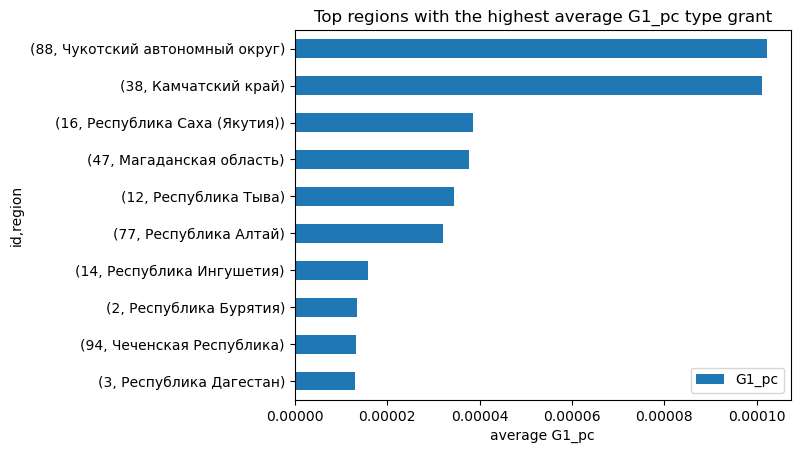

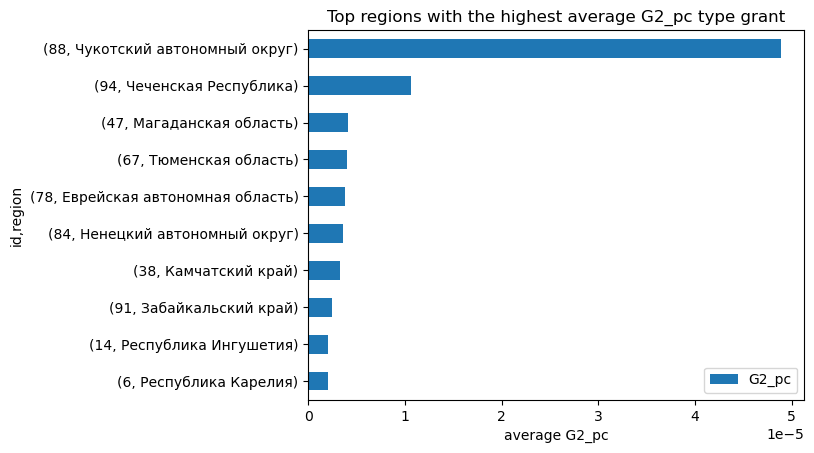

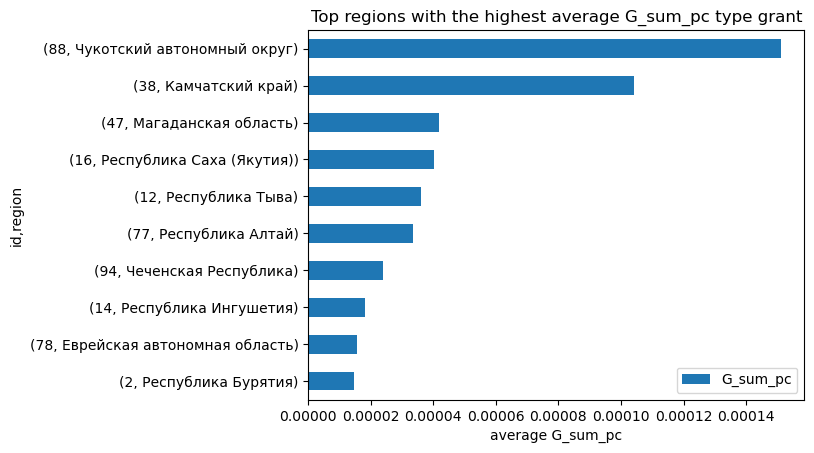

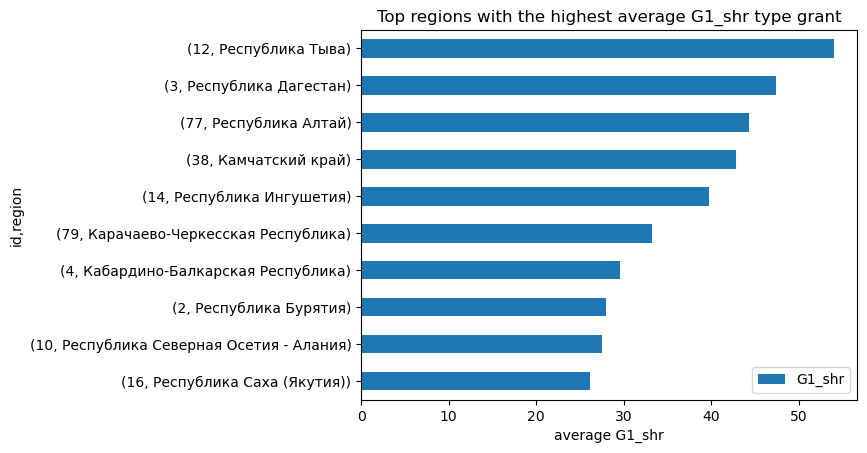

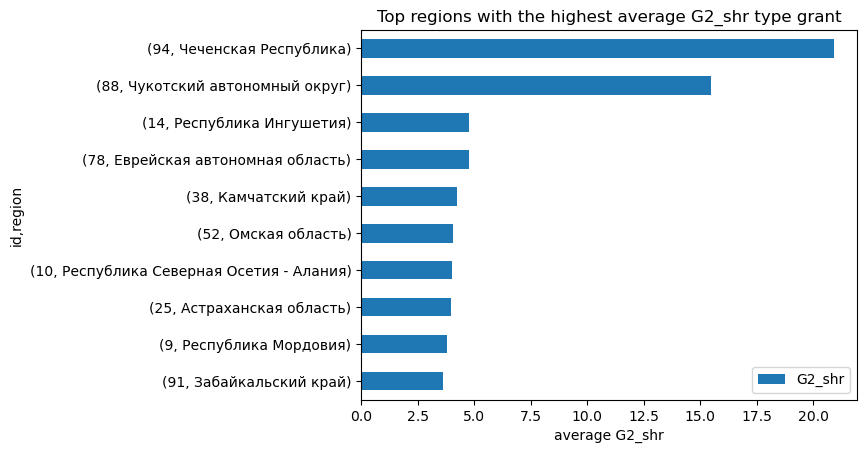

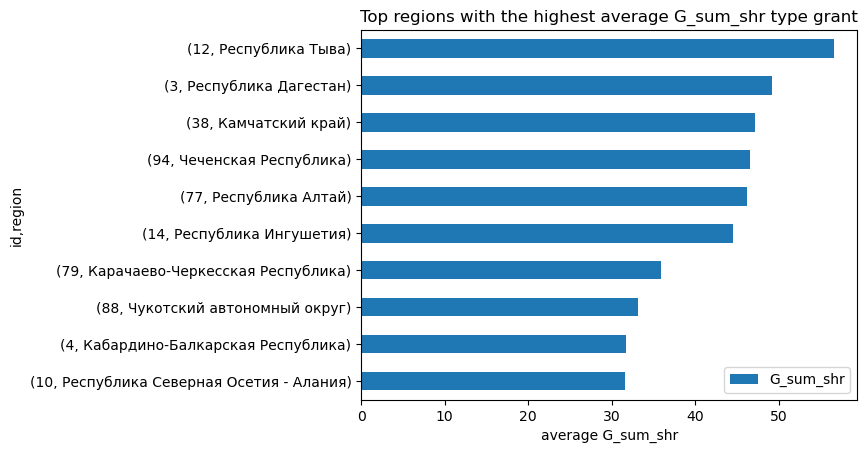

In [28]:
for grant in ['G1_pc', 'G2_pc', 'G_sum_pc', 'G1_shr', 'G2_shr', 'G_sum_shr']:
    mean_df.nlargest(10, grant)[grant].sort_values(ascending=True).to_frame().plot(kind='barh', title=f"Top regions with the highest average {grant} type grant")
    plt.xlabel(f'average {grant}')
    plt.show() 

    


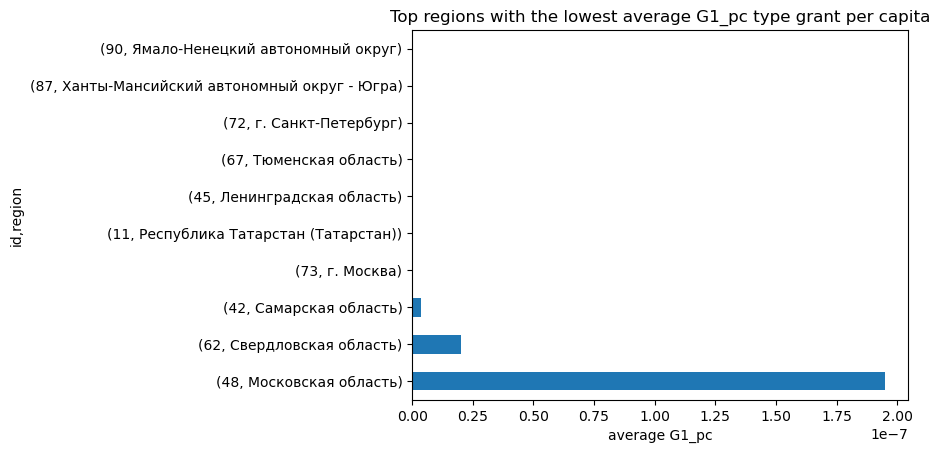

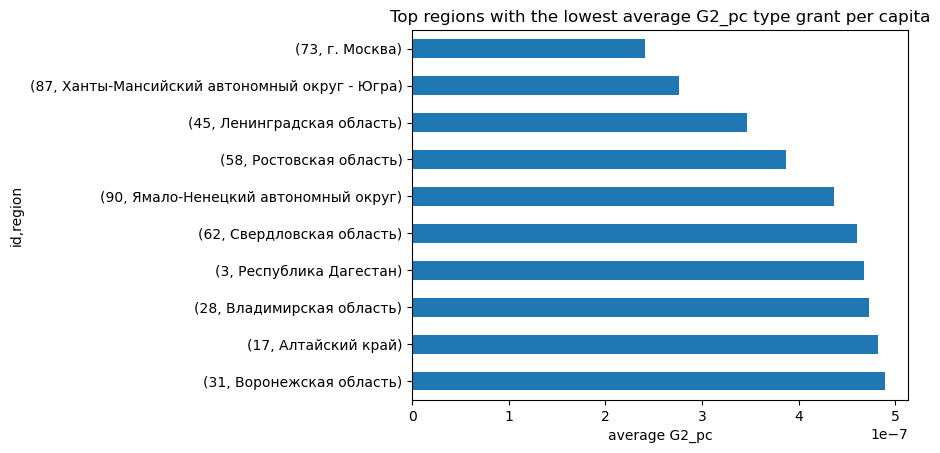

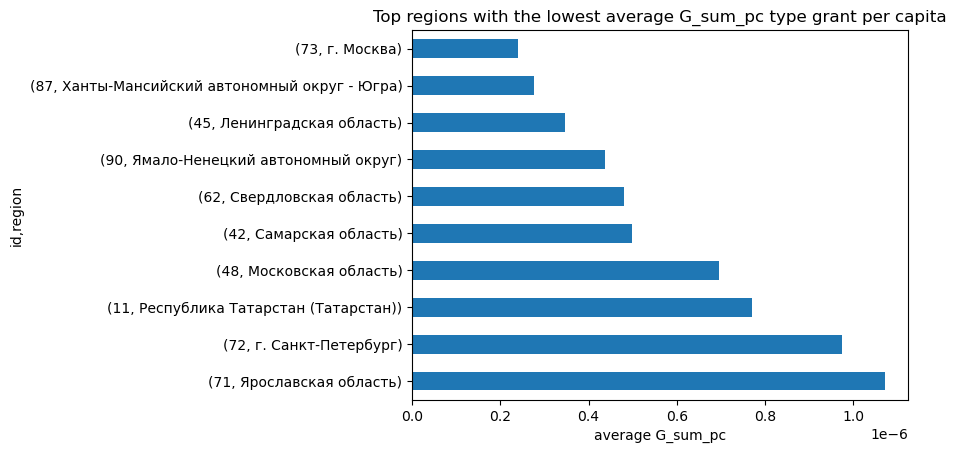

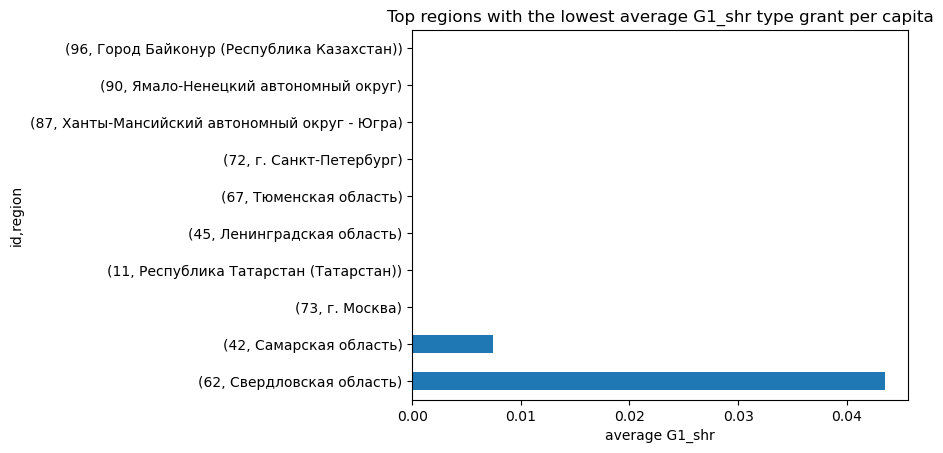

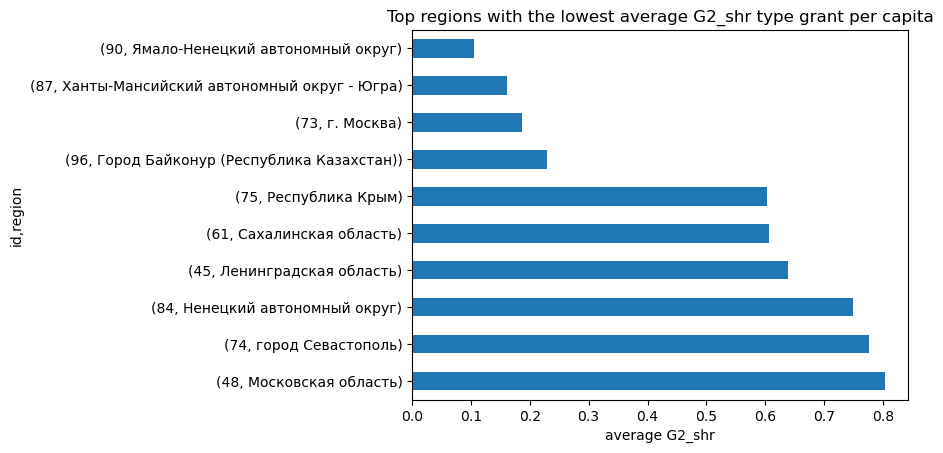

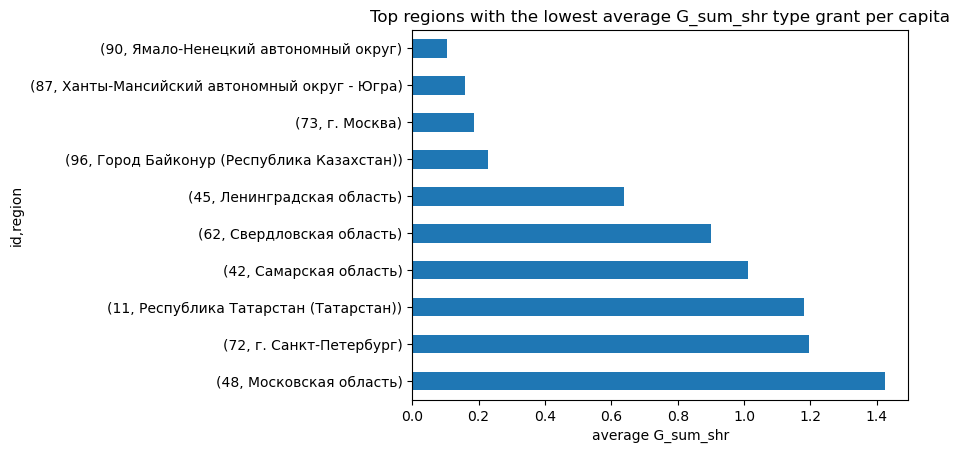

In [20]:
for grant in ['G1_pc', 'G2_pc', 'G_sum_pc', 'G1_shr', 'G2_shr', 'G_sum_shr']:
    mean_df.nsmallest(10, grant)[grant].sort_values(ascending=False).plot(kind='barh', title=f"Top regions with the lowest average {grant} type grant per capita")
    plt.xlabel(f'average {grant}')
    plt.show()

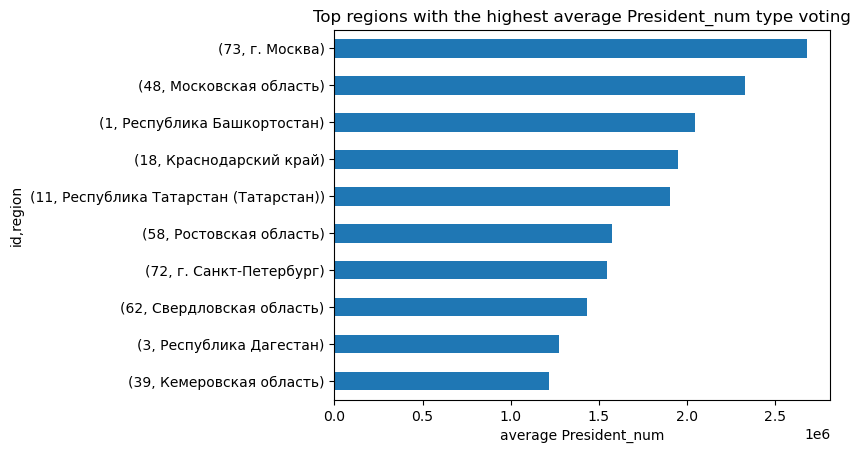

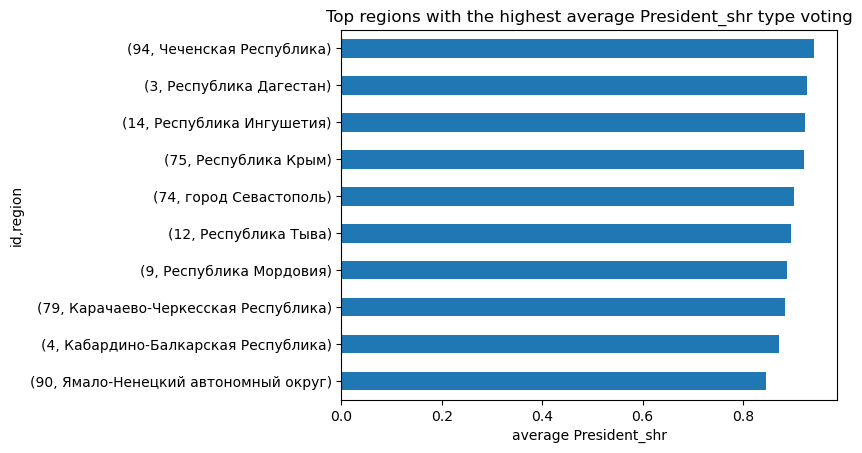

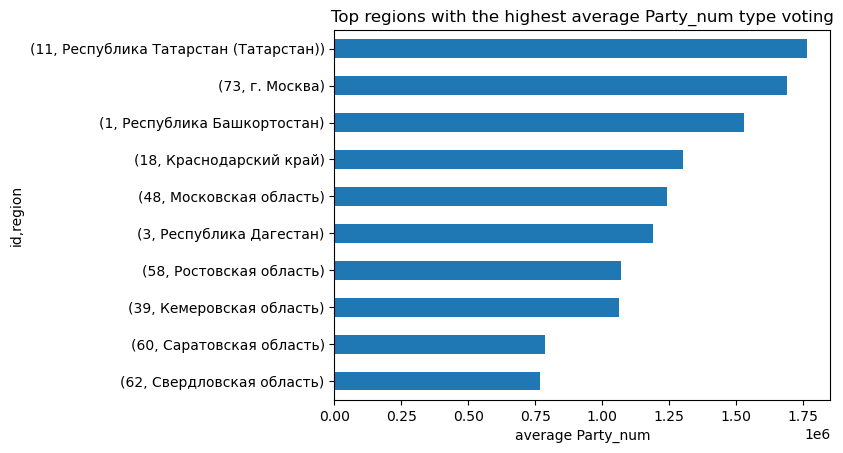

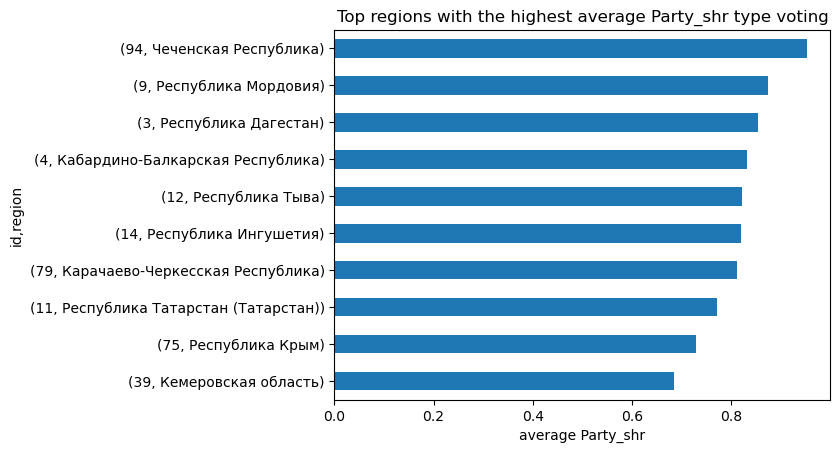

In [32]:
for vote in ['President_num', 'President_shr', 'Party_num', 'Party_shr']:
    mean_df.nlargest(10, vote)[vote].sort_values(ascending=True).plot(kind='barh', title=f"Top regions with the highest average {vote} type voting")
    plt.xlabel(f'average {vote}')

    plt.show()

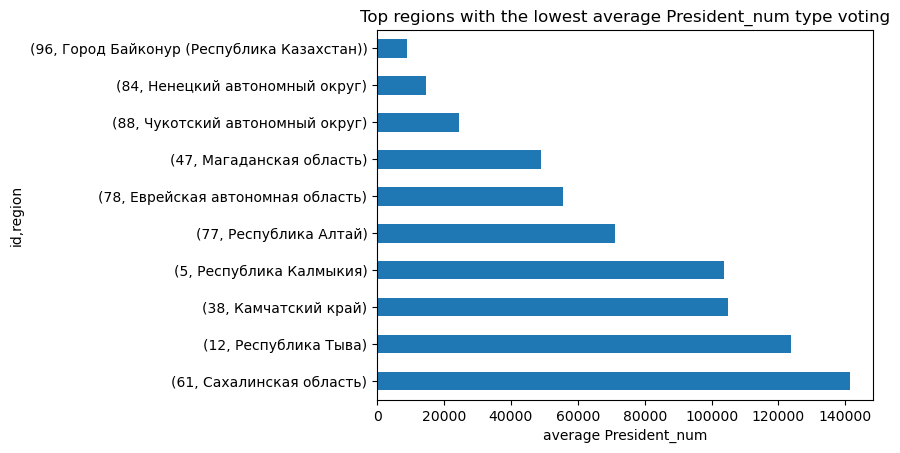

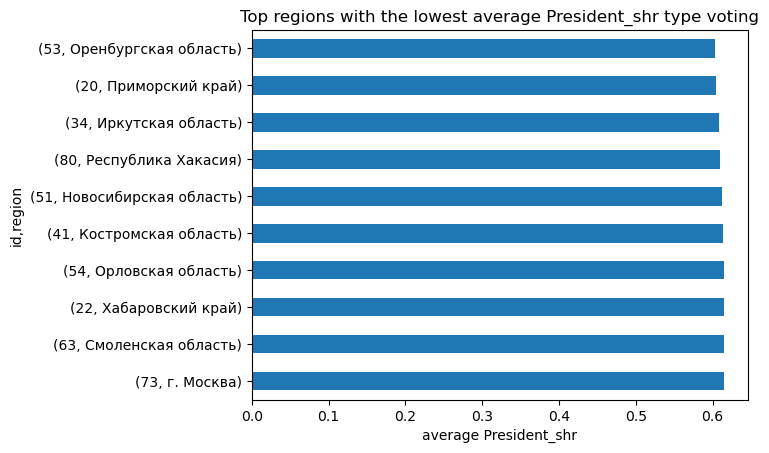

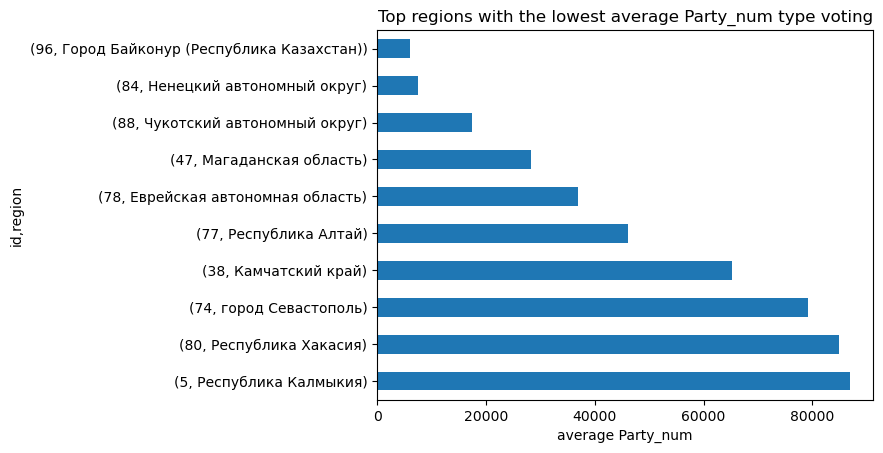

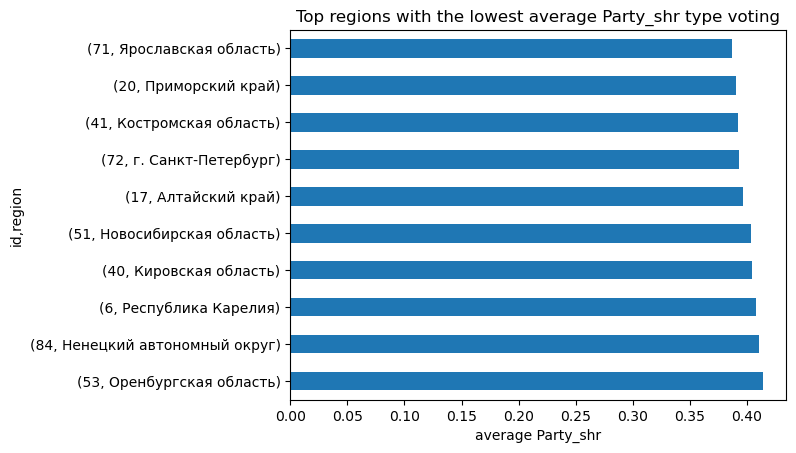

In [34]:
for vote in ['President_num', 'President_shr', 'Party_num', 'Party_shr']:
    mean_df.nsmallest(10, vote)[vote].sort_values(ascending=False) .plot(kind='barh', title=f"Top regions with the lowest average {vote} type voting")
    plt.xlabel(f'average {vote}')
    plt.show()

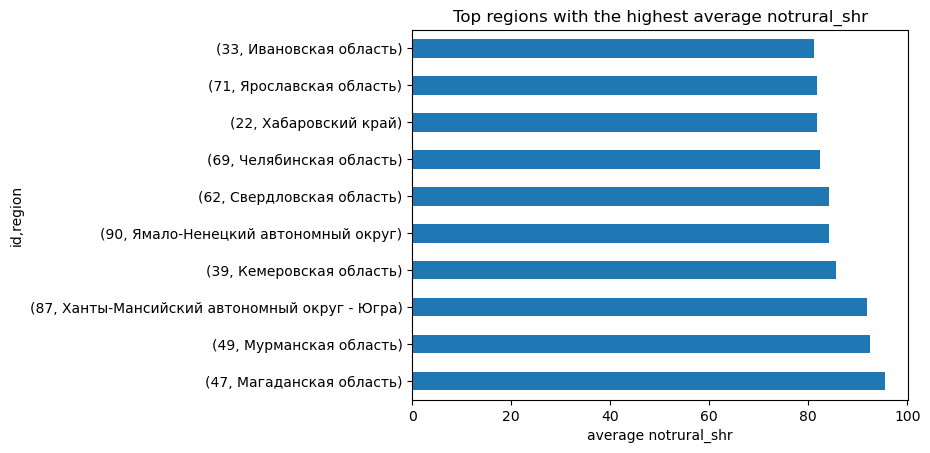

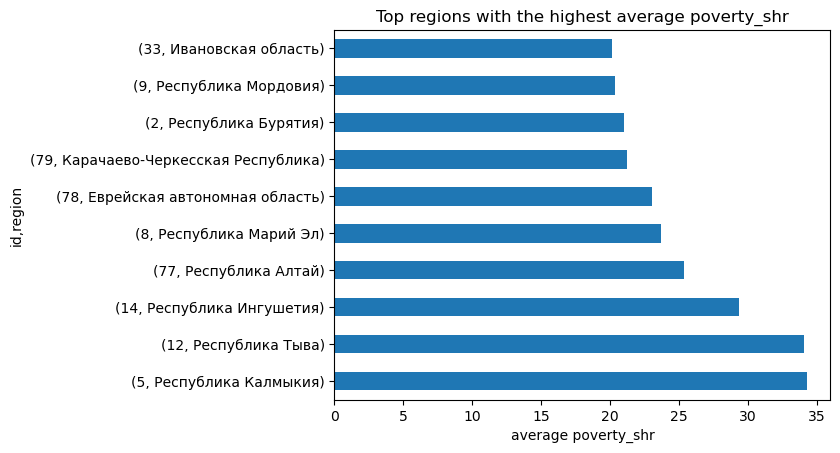

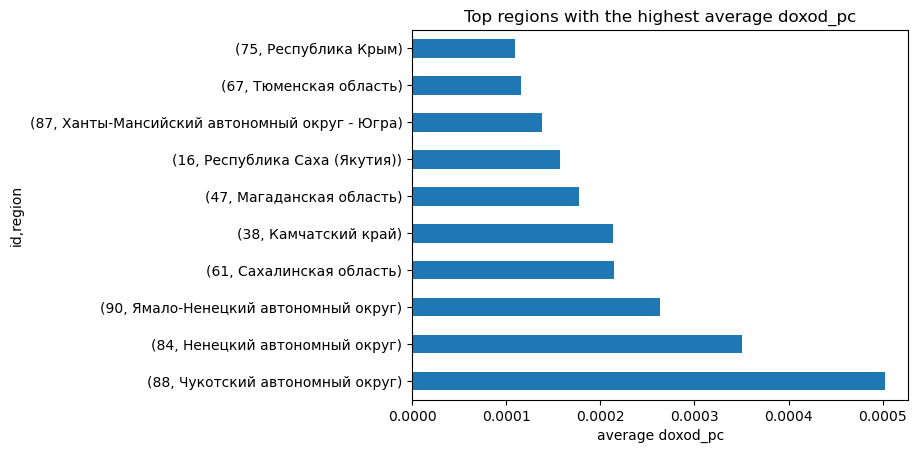

In [201]:
for control in ['rural', 'poverty_shr', 'income_pc']:
    mean_df.nlargest(10, control)[control].sort_values(ascending=False).plot(kind='barh', title=f"Top regions with the highest average {control}")
    plt.xlabel(f'average {control}')
    plt.show()

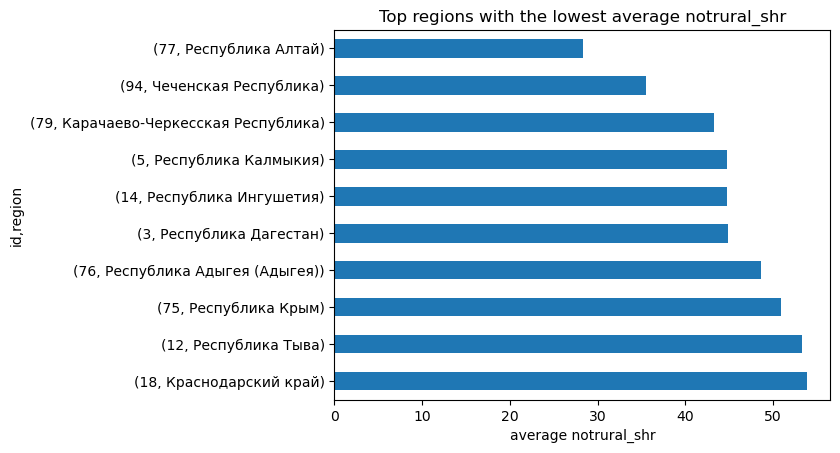

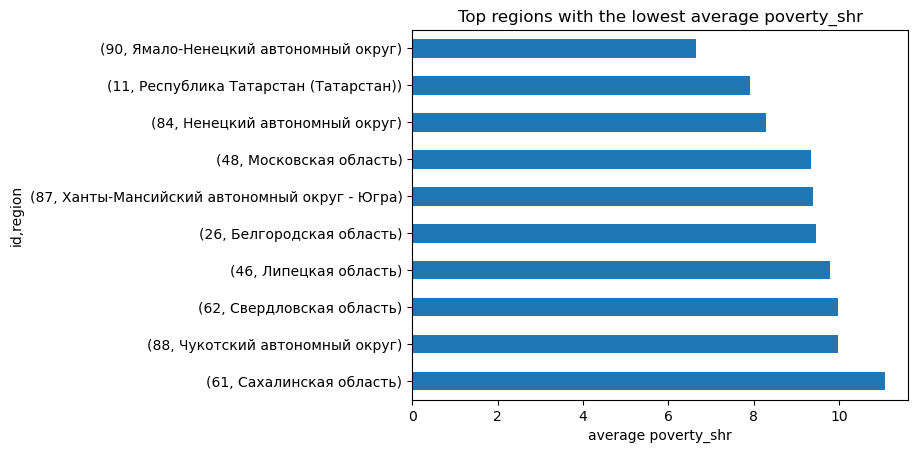

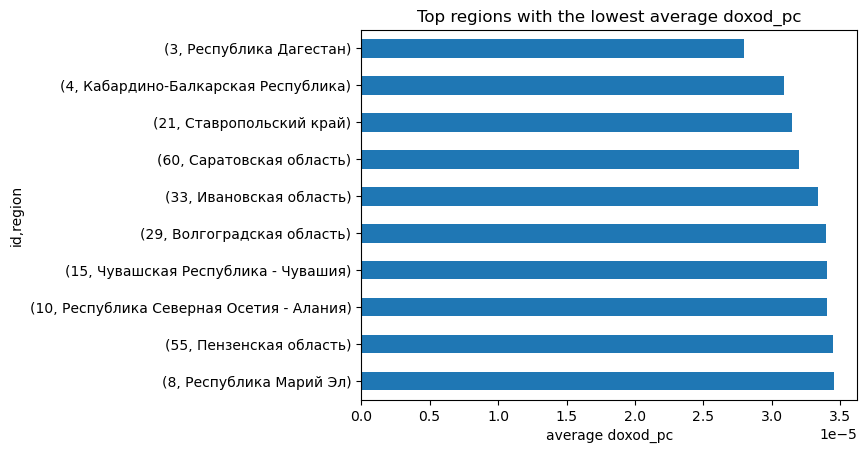

In [202]:
for control in ['rural', 'poverty_shr', 'income_pc']:
    mean_df.nsmallest(10, control)[control].sort_values(ascending=False).plot(kind='barh', title=f"Top regions with the lowest average {control}")
    plt.xlabel(f'average {control}')

    plt.show()

In [207]:
mean_df

,,year,period,G1,G2,G3,doxod,President_num,year_vo,President_voters,notrural_shr,...,logG2,logG3,President_shr,G1_pc,G2_pc,G3_pc,doxod_pc,G1_shr,G2_shr,G3_shr
id,region,,,,,,,,,,,,,,,,,,,,,
1,Республика Башкортостан,2012.5,2.375000,10.224979,6.968657,2.240956,156.157708,2042780.500,2009.750000,2.451918e+06,61.165625,...,1.711733,0.843568,0.828888,2.522718e-06,0.000002,5.532846e-07,0.000038,5.160695,3.634412,1.219494
2,Республика Бурятия,2012.5,2.375000,13.204693,13.197106,0.991859,48.473358,305311.375,2009.750000,4.456345e+05,58.163750,...,2.596101,0.611072,0.683950,1.349737e-05,0.000014,1.015188e-06,0.000050,24.367627,27.952389,2.076289
3,Республика Дагестан,2012.5,2.375000,38.198991,39.176607,1.388739,83.468216,1271443.625,2009.750000,1.370341e+06,44.913125,...,3.588423,0.742191,0.927925,1.270797e-05,0.000013,4.673996e-07,0.000028,40.058375,47.408358,1.778294
4,Кабардино-Балкарская Республика,2012.5,2.375000,7.626083,7.645201,0.505120,26.678581,397250.125,2009.750000,4.513742e+05,53.881875,...,2.104745,0.387039,0.871100,8.836713e-06,0.000009,5.856181e-07,0.000031,25.251123,29.568041,2.132264
5,Республика Калмыкия,2012.5,2.375000,2.724184,2.566804,0.333794,11.053543,103696.625,2009.750000,1.394263e+05,44.778125,...,1.235920,0.276230,0.742675,9.748059e-06,0.000009,1.185460e-06,0.000039,22.159878,23.810436,3.186836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,Чукотский автономный округ,2012.5,2.375000,6.686335,5.132500,2.524848,25.352839,24352.875,2009.750000,3.048805e+04,67.552500,...,1.474221,1.021019,0.796912,1.327464e-04,0.000102,4.886282e-05,0.000502,24.322634,17.648497,15.480043
90,Ямало-Ненецкий автономный округ,2012.5,2.375000,0.448708,0.000000,0.235324,140.942528,271353.250,2009.750000,3.210919e+05,84.251250,...,0.000000,0.109074,0.845000,8.302650e-07,0.000000,4.363542e-07,0.000263,0.196738,0.000000,0.105527
91,Забайкальский край,2012.5,2.375000,10.185914,8.659168,2.008483,51.962283,342767.750,2009.750000,5.025412e+05,67.335833,...,2.233567,0.925516,0.684230,1.186879e-05,0.000009,2.176691e-06,0.000054,17.675710,17.200542,3.509989


In [204]:
year_df = df.groupby('year').count()
year_df 

,id,period,region,G1,G2,G3,doxod,President_num,year_vo,President_voters,...,logG2,logG3,President_shr,G1_pc,G2_pc,G3_pc,doxod_pc,G1_shr,G2_shr,G3_shr
year,,,,,,,,,,,,,,,,,,,,,
2005,83,83,83,83,83,83,83,83,83,83,...,83,83,83,78,78,78,78,83,83,83
2006,83,83,83,83,83,83,83,83,83,83,...,83,83,83,78,78,78,78,83,83,83
2007,83,83,83,83,83,83,83,83,83,83,...,83,83,83,78,78,78,78,83,83,83
2008,83,83,83,83,83,83,83,83,83,83,...,83,83,83,78,78,78,78,83,83,83
2009,84,84,84,84,84,84,84,84,84,84,...,84,84,84,81,81,81,81,84,84,84
2010,84,84,84,84,84,84,84,84,84,84,...,84,84,84,81,81,81,81,84,84,84
2011,84,84,84,84,84,84,84,84,84,84,...,84,84,84,81,81,81,81,84,84,84
2012,84,84,84,84,84,84,84,84,84,84,...,84,84,84,81,81,81,81,84,84,84
2013,84,84,84,84,84,84,84,84,84,84,...,84,84,84,81,81,81,81,84,84,84


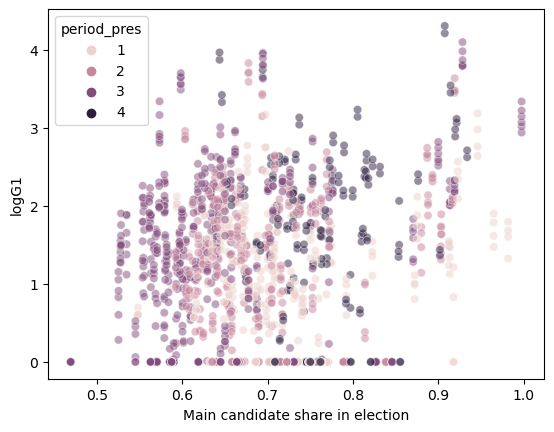

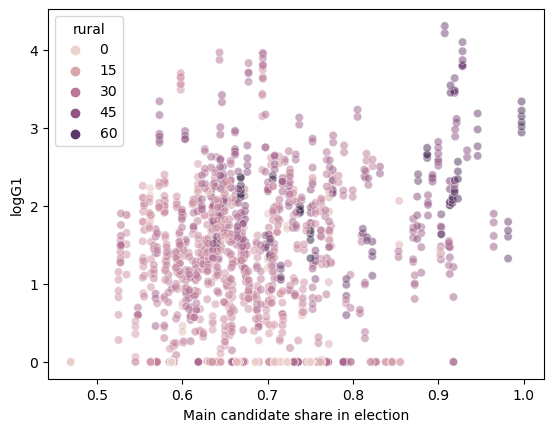

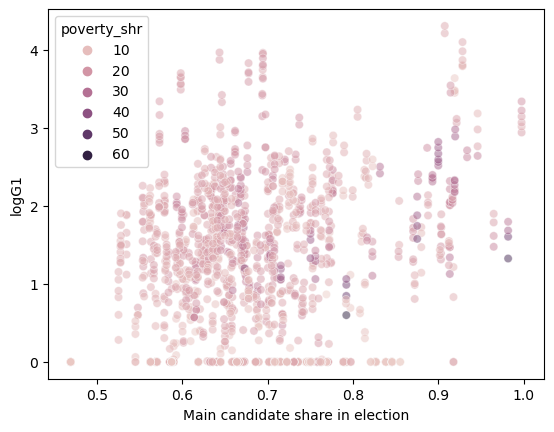

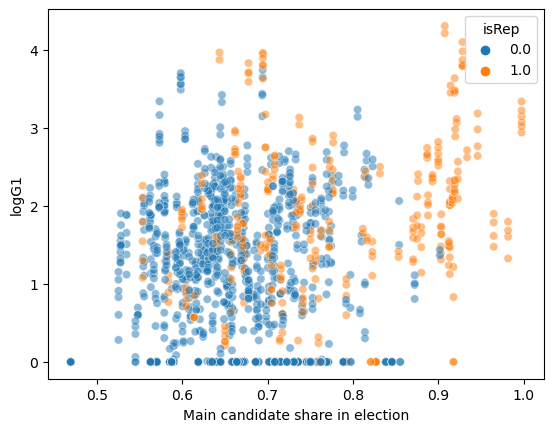

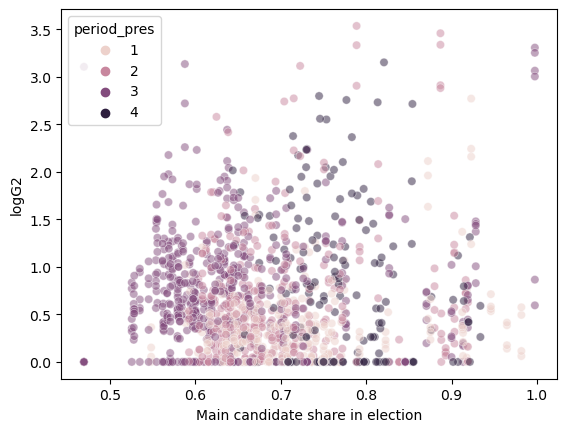

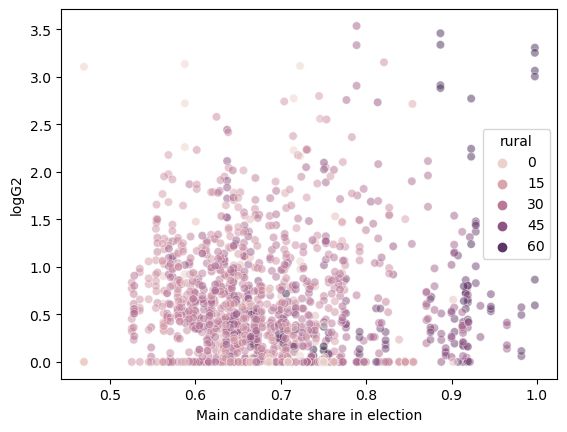

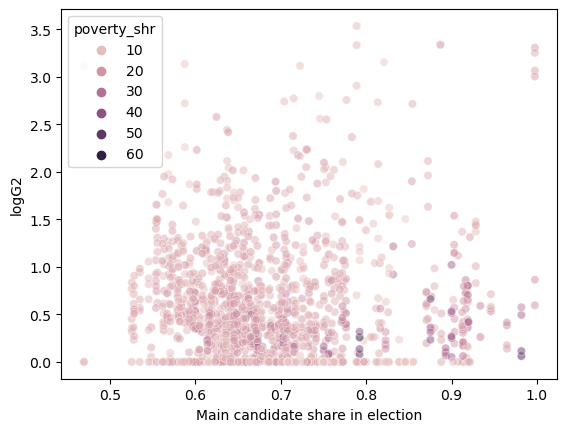

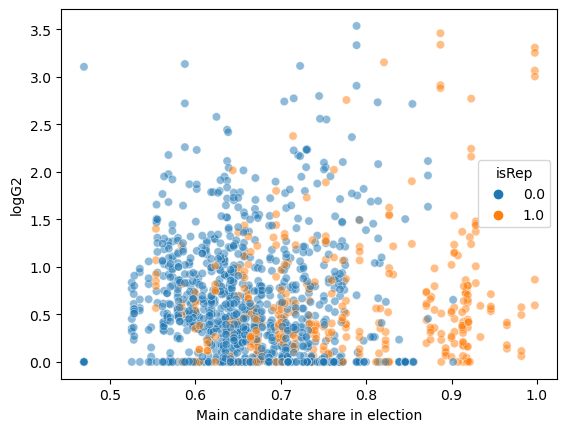

In [17]:
for grant in ['logG1','logG2']:
    for control in ['period_pres', 'rural', 'poverty_shr', 'isRep']:    
        sns.scatterplot(data=df, x="President_shr", y=grant, hue=control, alpha=0.5)
        plt.ylabel(grant)
        plt.xlabel('Main candidate share in election')
        #plt.title(f"Distribution of the {grant} with the share of voting for the governmental candidate for president adding {control} info");
        plt.show()

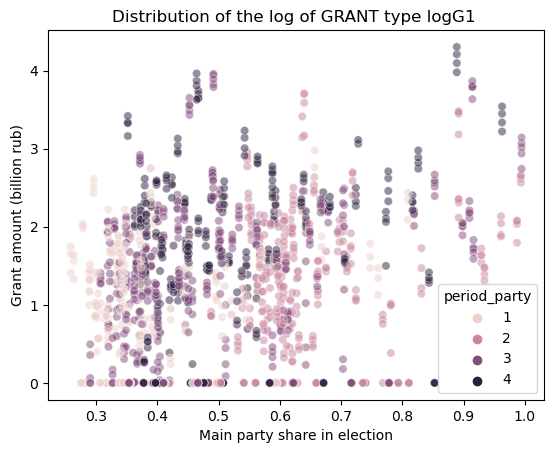

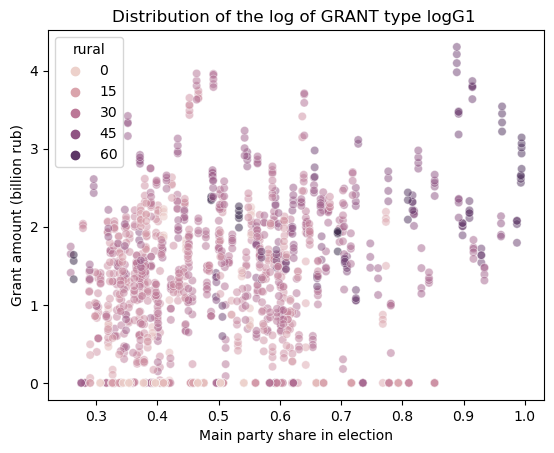

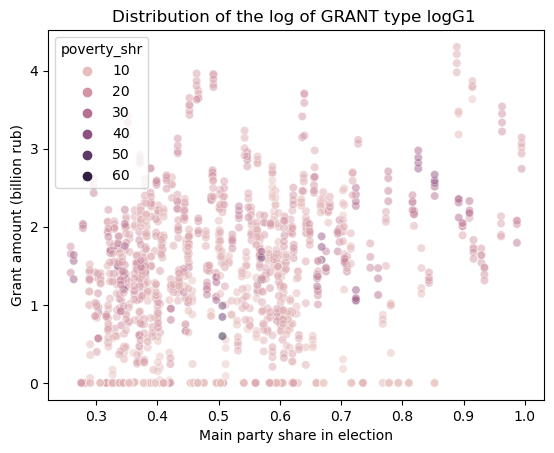

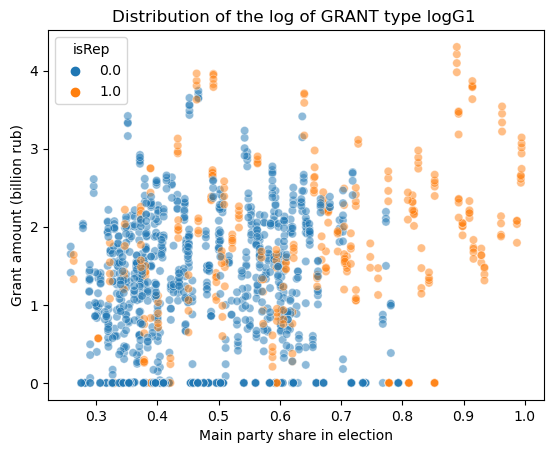

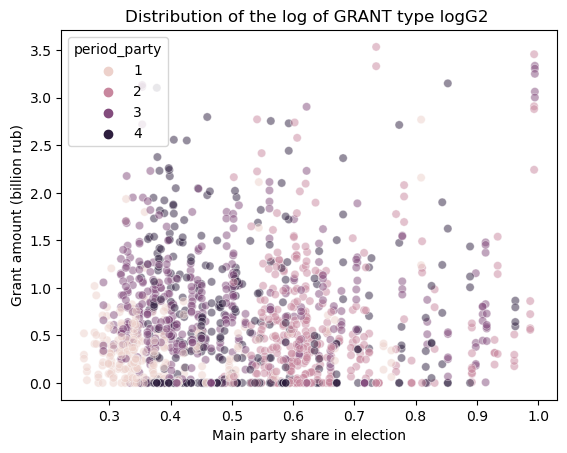

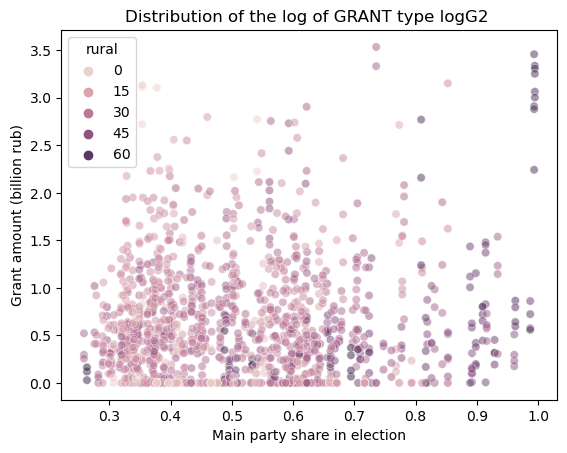

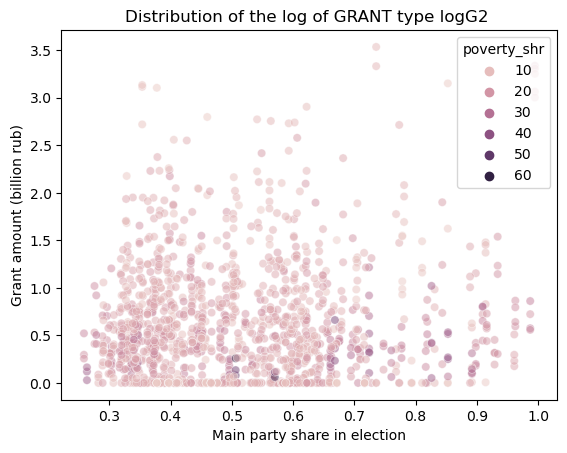

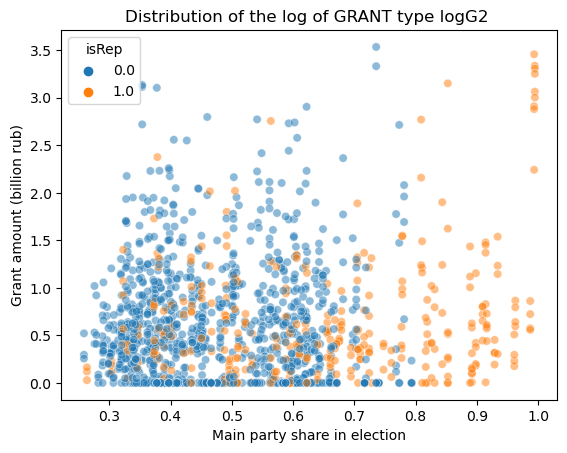

In [9]:
for grant in ['logG1','logG2']:
    for control in ['period_party','rural', 'poverty_shr', 'isRep']:    
        sns.scatterplot(data=df, x="Party_shr", y=grant, hue=control, alpha=0.5)
        plt.ylabel('Grant amount (billion rub)')
        plt.xlabel('Main party share in election')
        #plt.title(f"Distribution of the {grant} ");
        plt.show()

<Axes: xlabel='President_shr', ylabel='logG3'>

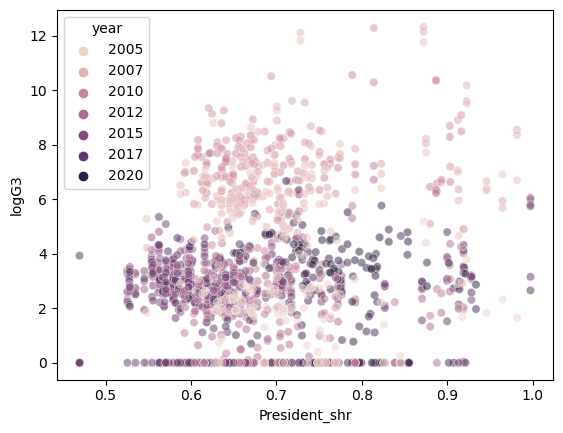

In [187]:
sns.scatterplot(data=grant_party, x="President_shr", y="logG_sum", hue="year", alpha=0.5)

<AxesSubplot:xlabel='President_shr', ylabel='log_G1'>

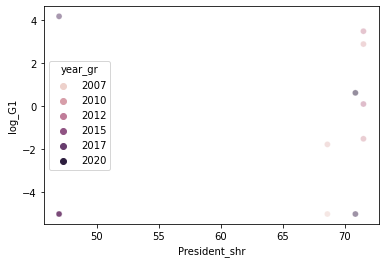

In [9]:
sns.scatterplot(data=grant_party[grant_party.id == 73], x="President_shr", y="logG1", hue="year", alpha=0.5)

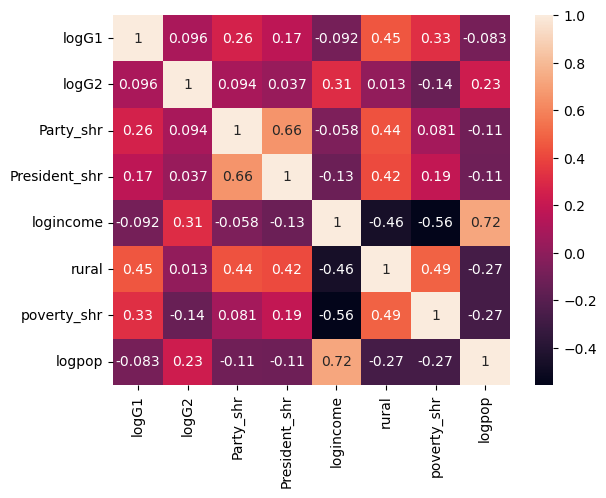

In [10]:
plt.figure()
    #plt.title(f"Period {period}")
sns.heatmap(df[["logG1", "logG2", "Party_shr", "President_shr",  "logincome", 'rural', 'poverty_shr', 'logpop']].corr(), annot=True)
plt.show()

In [12]:
df_period_pres = df.groupby(['period_pres', 'id']).mean()
df_period_pres

C:\Users\HP\AppData\Local\Temp\ipykernel_19120\1913858467.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_period_pres = df.groupby(['period_pres', 'id']).mean()


year         G1        G2      income  President_num  \
period_pres id                                                           
1           1   2006.5   0.916485  0.339234   87.397811      2365768.0   
            2   2006.5   7.514472  0.502527   25.185076       298120.0   
            3   2006.5  17.377948  0.819857   37.369332      1263386.0   
            4   2006.5   4.505959  0.331271   13.633212       491916.0   
            5   2006.5   1.431408  0.223779    5.996966       114713.0   
...                ...        ...       ...         ...            ...   
4           87  2019.5   0.000000  0.000000  321.590816       600404.0   
            88  2019.5  11.802169  0.440394   55.492146        22709.0   
            90  2019.5   0.000000  0.000000  241.982578       291409.0   
            91  2019.5  12.164118  5.659904   93.164111       329911.0   
            94  2019.5  31.962615  1.056786  112.368782       593806.0   

                year_vo_pres  President_voters  notrural_shr  poverty_shr  \
period_pres id                                                              
1           1         2004.0      2.577651e+06        59.925       13.425   
            2         2004.0      4.477621e+05        56.125       27.100   
            3         2004.0      1.335362e+06        44.250       16.400   
            4         2004.0      5.098103e+05        56.850       19.350   
            5         2004.0      1.447848e+05        43.900       48.550   
...                      ...               ...           ...          ...   
4           87        2018.0      7.879318e+05        92.555        8.650   
            88        2018.0      2.758960e+04        71.325        8.250   
            90        2018.0      3.406699e+05        83.960        5.150   
            91        2018.0      4.580189e+05        68.270       21.200   
            94        2018.0      6.493941e+05        37.465       20.550   

                       pop  ...  _est_est3  _est_est4  ifPresEl         G1_pc  \
period_pres id              ...                                                 
1           1   4061219.00  ...       0.25       0.25      0.25  2.259553e-07   
            2    966361.25  ...       0.25       0.25      0.25  7.778472e-06   
            3   2739168.25  ...       0.25       0.25      0.25  6.320673e-06   
            4    862403.50  ...       0.25       0.25      0.25  5.231170e-06   
            5    292477.00  ...       0.25       0.25      0.25  4.898070e-06   
...                    ...  ...        ...        ...       ...           ...   
4           87  1675200.50  ...       1.00       1.00      0.00  0.000000e+00   
            88    49941.50  ...       1.00       1.00      0.00  2.363275e-04   
            90   544344.00  ...       1.00       1.00      0.00  0.000000e+00   
            91  1059667.00  ...       1.00       1.00      0.00  1.147980e-05   
            94  1478098.50  ...       1.00       1.00      0.00  2.161804e-05   

                       G2_pc      G_sum_pc  income_pc     G1_shr    G2_shr  \
period_pres id                                                               
1           1   8.332359e-08  3.092789e-07   0.000022   0.858323  0.477258   
            2   5.199712e-07  8.298443e-06   0.000026  30.094473  2.084871   
            3   2.989844e-07  6.619658e-06   0.000014  47.421512  2.314503   
            4   3.832157e-07  5.614386e-06   0.000016  33.768685  2.896065   
            5   7.658960e-07  5.663966e-06   0.000021  24.323776  3.668693   
...                      ...           ...        ...        ...       ...   
4           87  0.000000e+00  0.000000e+00   0.000192   0.000000  0.000000   
            88  8.812286e-06  2.451398e-04   0.001111  21.298544  0.777410   
            90  0.000000e+00  0.000000e+00   0.000445   0.000000  0.000000   
            91  5.335395e-06  1.681520e-05   0.000088  13.067160  6.169031   
            94  7.157438e-07  2.233378e-05   0.000076  28.76126

C:\Users\HP\AppData\Local\Temp\ipykernel_19120\132131051.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns_plot = sns.distplot(G1_0)
C:\Users\HP\AppData\Local\Temp\ipykernel_19120\132131051.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns_plot = sns.distplot(G1_0)


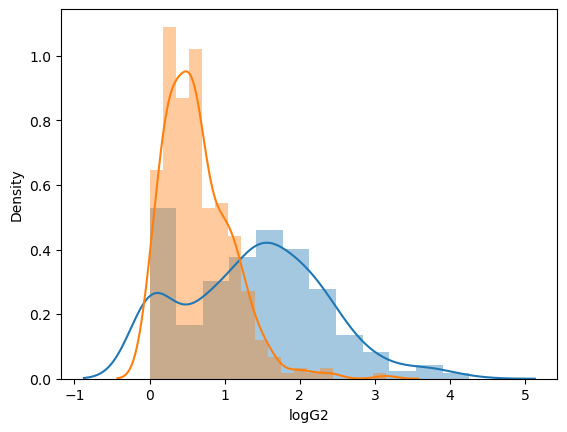

In [13]:
for grant in ['logG1','logG2']:
    G1_0 = df_period_pres[grant]
    sns_plot = sns.distplot(G1_0)
    fig = sns_plot.get_figure()
    
    #fig.update_layout(
      #  autosize=False,
       # width=700, # задаем размер графика
        #height=400,
        #title='Зависимость средних выплат клиента от времени жизни с компанией',
        #xaxis_title='месяцев с подкл. услугами',
        #yaxis_title='средние выплаты клиента'
        #)
    #fig.show()


C:\Users\HP\AppData\Local\Temp\ipykernel_19120\284574097.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns_plot = sns.distplot(G1_0)
C:\Users\HP\AppData\Local\Temp\ipykernel_19120\284574097.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns_plot = sns.distplot(G1_0)


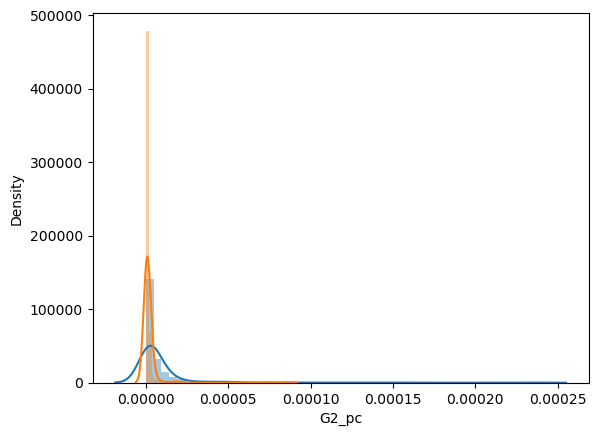

In [15]:
for grant in ['G1_pc', 'G2_pc']:    
    G1_0 = df_period_pres[grant] 
    sns_plot = sns.distplot(G1_0)
    fig = sns_plot.get_figure()

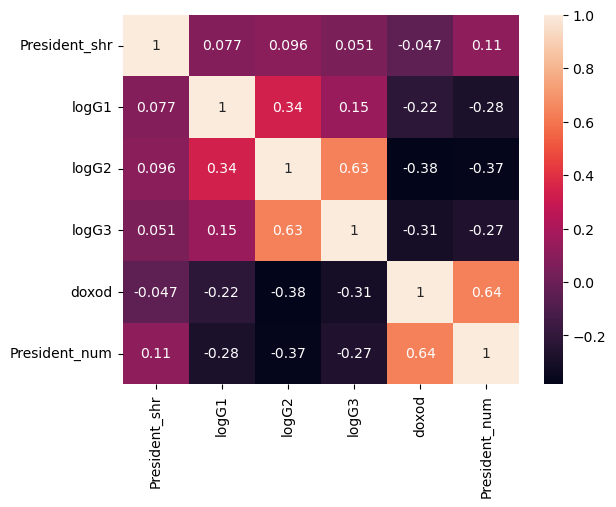

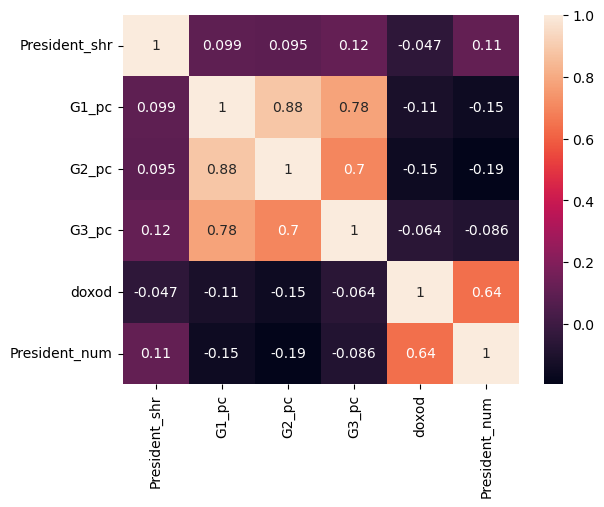

In [34]:
for grant in [["logG1", "logG2", "logG_sum"], ['G1_pc', 'G2_pc', 'G_sum_pc']]:        
    plt.figure()
        #plt.title(f"Period {period}")
    sns.heatmap(df_period[["President_shr", grant[0], grant[1], grant[2], "income", "President_num"]].corr(), annot=True)
    plt.show()
 

<Axes: xlabel='President_shr', ylabel='logG1'>

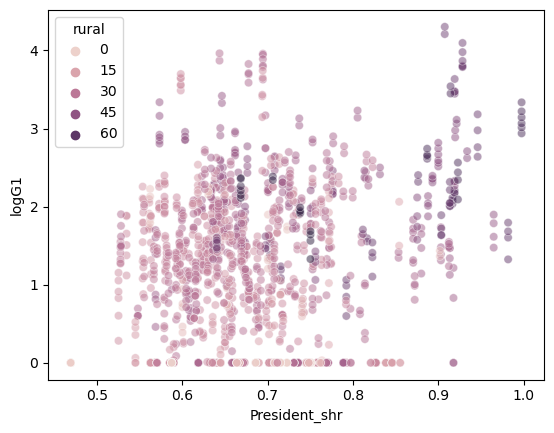

In [69]:
sns.scatterplot(data=df, x="President_shr", y="logG1", hue="rural", alpha=0.5)

In [76]:
from sklearn.linear_model import LinearRegression

In [77]:
reg = LinearRegression()

In [78]:
grant_party = grant_party.dropna()

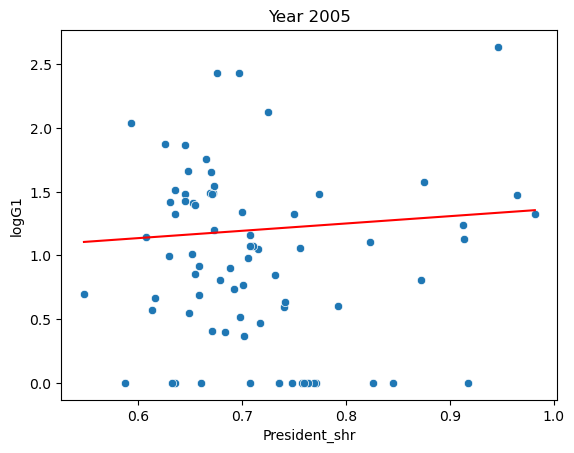

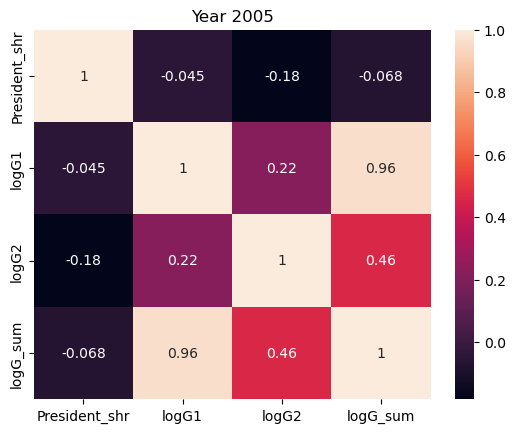

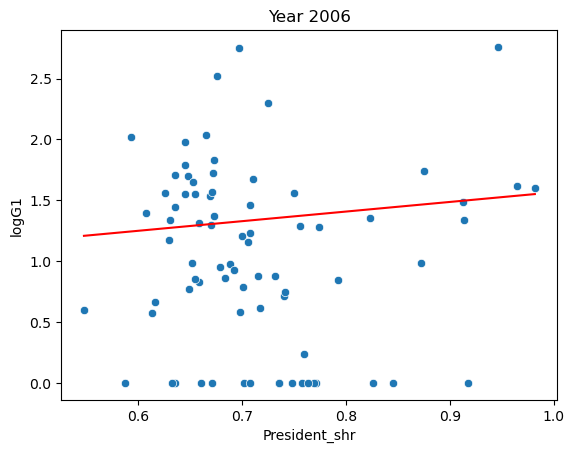

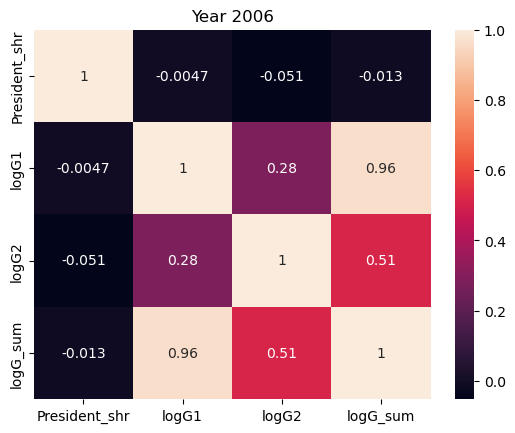

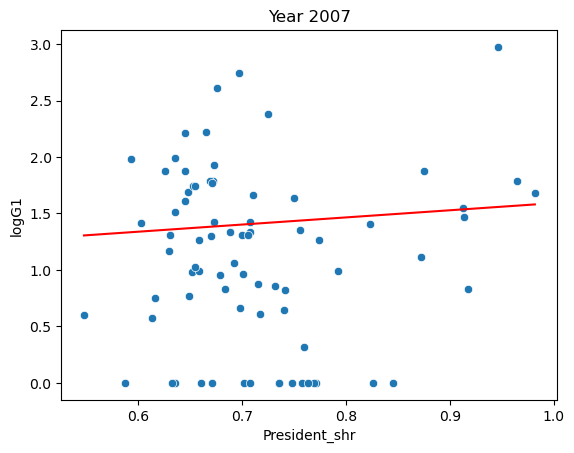

...

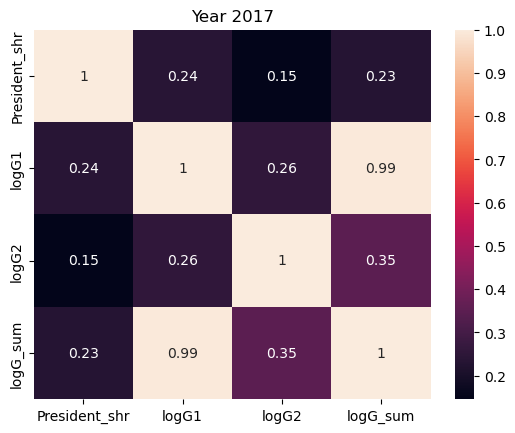

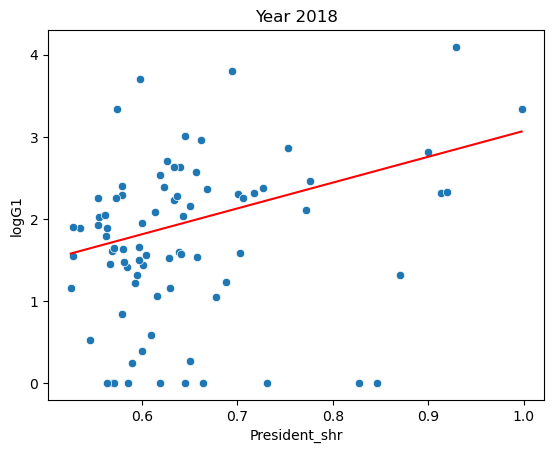

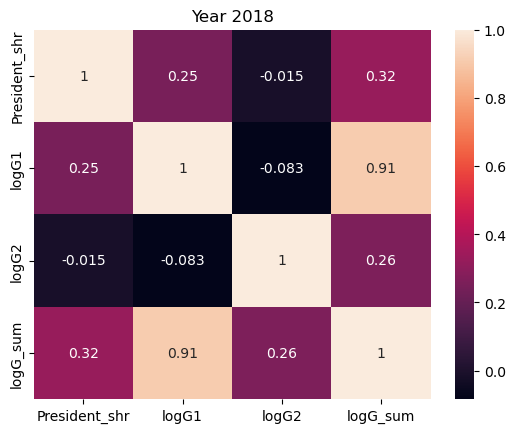

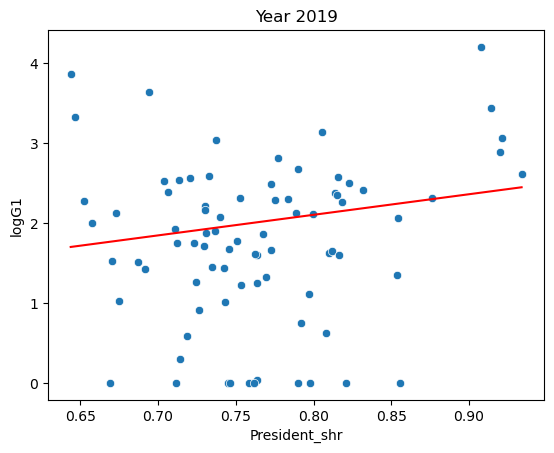

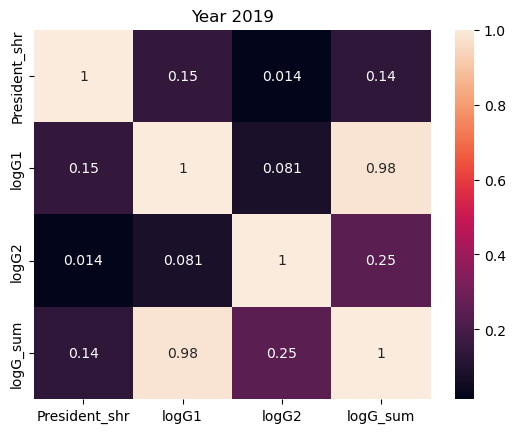

In [84]:
for year in range(2005, 2020):
    df = grant_party[grant_party.year == year]
    
    reg.fit(df[["President_shr"]][df.logG1 != 0], df["logG1"][df.logG1 != 0])
    
    k = reg.coef_[0]
    b = reg.intercept_
    
    plt.figure()
    plt.title(f"Year {year}")
    sns.scatterplot(data=df, x="President_shr", y="logG1")

    x = np.linspace(df["President_shr"].min(), df["President_shr"].max(), 2)
    y = x * k + b

    plt.plot(x, y, color='red')
    plt.show()
    
    plt.figure()
    plt.title(f"Year {year}")
    sns.heatmap(df[["President_shr", "logG1", "logG2", "logG_sum"]].corr(), annot=True)
    plt.show()

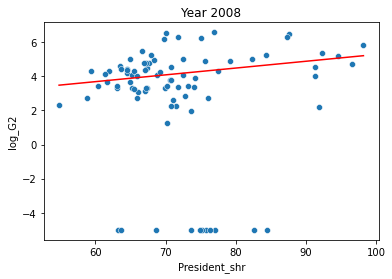

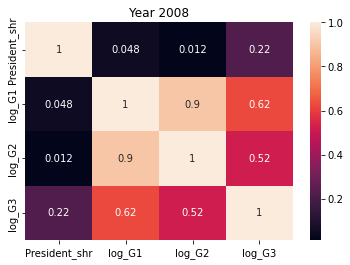

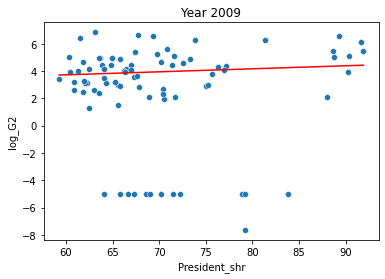

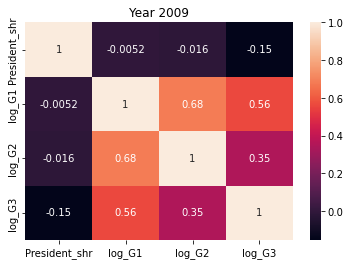

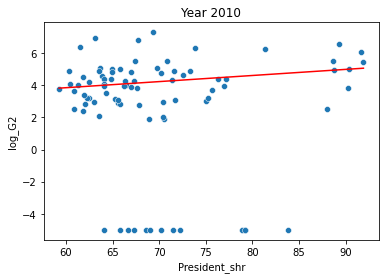

...

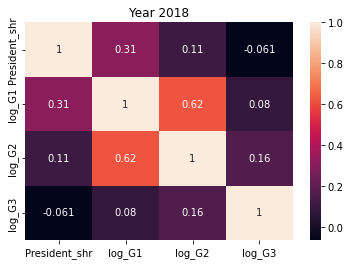

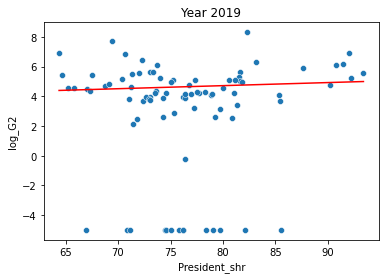

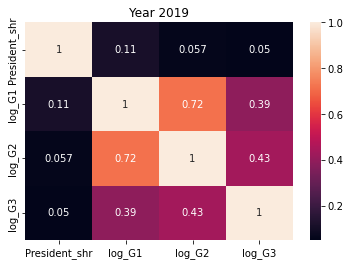

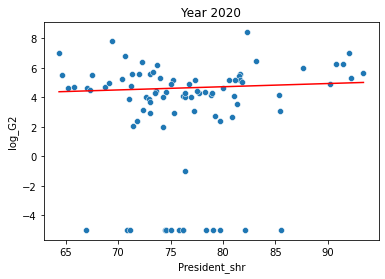

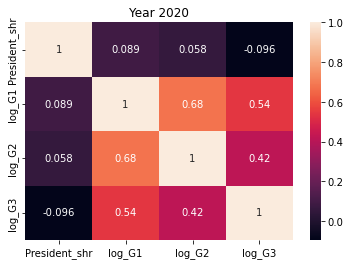

In [16]:
for year in range(2008, 2021):
    df = grant_party[grant_party.year_gr == year]
    
    reg.fit(df[["President_shr"]][df.log_G2 != -5], df["log_G2"][df.log_G2 != -5])
    
    k = reg.coef_[0]
    b = reg.intercept_
    
    plt.figure()
    plt.title(f"Year {year}")
    sns.scatterplot(data=df, x="President_shr", y="log_G2")

    x = np.linspace(df["President_shr"].min(), df["President_shr"].max(), 2)
    y = x * k + b

    plt.plot(x, y, color='red')
    plt.show()
    
    plt.figure()
    plt.title(f"Year {year}")
    sns.heatmap(df[["President_shr", "log_G1", "log_G2", "log_G_sum"]].corr(), annot=True)
    plt.show()

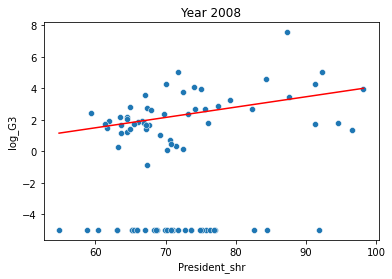

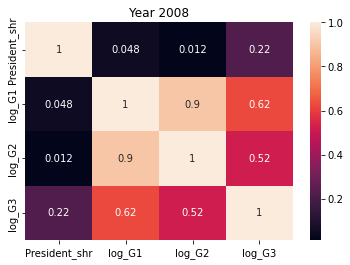

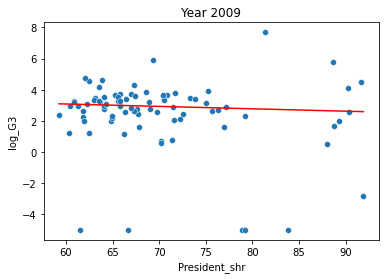

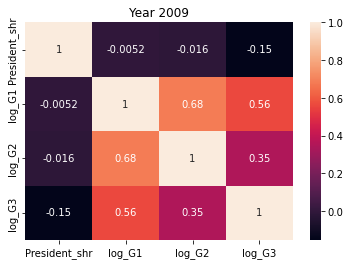

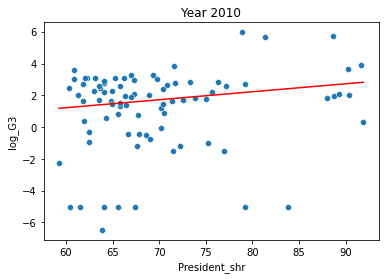

...

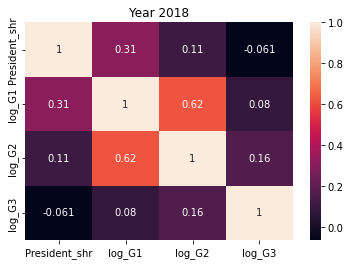

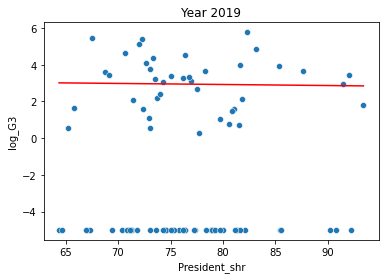

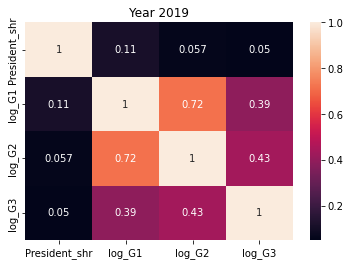

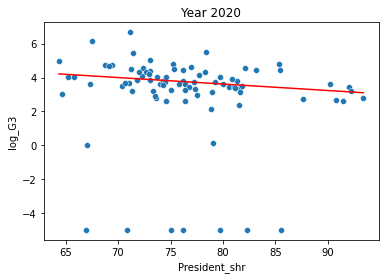

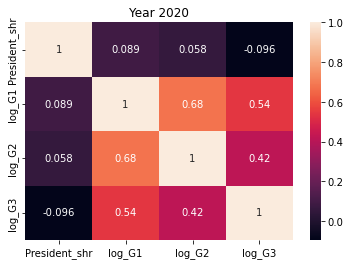

In [17]:
for year in range(2008, 2021):
    df = grant_party[grant_party.year_gr == year]
    
    reg.fit(df[["President_shr"]][df.log_G_sum != 0], df["log_G_sum"][df.log_G_sum != 0])
    
    k = reg.coef_[0]
    b = reg.intercept_
    
    plt.figure()
    plt.title(f"Year {year}")
    sns.scatterplot(data=df, x="President_shr", y="log_G_sum")

    x = np.linspace(df["President_shr"].min(), df["President_shr"].max(), 2)
    y = x * k + b

    plt.plot(x, y, color='red')
    plt.show()
    
    plt.figure()
    plt.title(f"Year {year}")
    sns.heatmap(df[["President_shr", "log_G1", "log_G2", "log_G_sum"]].corr(), annot=True)
    plt.show()

In [18]:
panel_df = grant_party.copy()
panel_df = panel_df.set_index(['id', 'year_gr'])

# Calculate and drop the NA Values


# Regression
FE = PanelOLS(panel_df.log_G1, panel_df['President_shr'],
              entity_effects = True,
              time_effects=True
              )
              
# Result
result = FE.fit(cov_type = 'clustered',
             cluster_entity=True,
             # cluster_time=True
             )
result

Dep. Variable:,log_G1,R-squared:,0.0011
Estimator:,PanelOLS,R-squared (Between):,0.2732
No. Observations:,1182,R-squared (Within):,-0.0044
Date:,"Wed, Mar 22 2023",R-squared (Overall):,0.2025
Time:,13:10:07,Log-likelihood,-1803.7
Cov. Estimator:,Clustered,,
,,F-statistic:,1.2184
Entities:,90,P-value,0.2699
Avg Obs:,13.133,Distribution:,"F(1,1078)"
Min Obs:,1.0000,,
Max Obs:,14.000,F-statistic (robust):,0.2985
